In [2]:
library(lme4) # necessary for model fitting: glm
library(effects) # necessary for making effect plots
library(blmeco) # necessary for calculating dispersion with GLMM models

Loading required package: Matrix
Loading required package: carData
lattice theme set by effectsTheme()
See ?effectsTheme for details.
Loading required package: MASS


# Statistics based on correspondent connection types

The frequencies in the columns (e.g. "hit_freq") represent the number of divine appeals per 100,000 words of total words per correspondent connection type.

In [3]:
jeake_conn <- read.delim(file = "stats_jeake.tsv", sep = "\t", header = T)

In [16]:
head(jeake_conn)

str(jeake_conn)

id,hit_freq,conf_freq,approve_freq,fixed_freq,object_freq,grat_freq,pray_freq,preserve_freq,presupp_freq,...,sender_generation,addressee_generation,sender_is_older,sender_over_40,addressee_over_40,age_gap_over_20,age_gap,gender_sender,gender_addressee,gender_pair
1,281.58,0,0,16.76,0,0,0.00,0.00,83.81,...,1600-1640,UNK,UNK,FALSE,UNK,UNK,NA,MALE,FEMALE,MALE-FEMALE
3,442.48,0,0,16.76,0,0,83.81,33.52,0.00,...,1600-1640,UNK,UNK,FALSE,MULT,UNK,NA,MALE,MULT,MALE-MULT
11,0.00,0,0,0.00,0,0,0.00,0.00,0.00,...,1600-1640,1600-1640,TRUE,FALSE,FALSE,FALSE,7,MALE,FEMALE,MALE-FEMALE
12,1.69,0,0,0.00,0,0,1.73,1.73,0.00,...,1600-1640,1600-1640,FALSE,FALSE,FALSE,FALSE,7,FEMALE,MALE,FEMALE-MALE
13,0.00,0,0,0.00,0,0,0.00,0.00,0.00,...,1600-1640,1600-1640,TRUE,FALSE,FALSE,FALSE,7,MALE,FEMALE,MALE-FEMALE
18,0.00,0,0,0.00,0,0,0.00,0.00,0.00,...,1600-1640,1600-1640,FALSE,FALSE,FALSE,FALSE,7,FEMALE,MALE,FEMALE-MALE


'data.frame':	272 obs. of  35 variables:
 $ id                  : int  1 3 11 12 13 18 20 21 26 27 ...
 $ hit_freq            : num  281.58 442.48 0 1.69 0 ...
 $ conf_freq           : num  0 0 0 0 0 0 1.73 0 0 0 ...
 $ approve_freq        : num  0 0 0 0 0 0 0 0 0 0 ...
 $ fixed_freq          : num  16.8 16.8 0 0 0 ...
 $ object_freq         : num  0 0 0 0 0 0 1.73 1.73 0 0 ...
 $ grat_freq           : num  0 0 0 0 0 0 1.73 1.73 0 0 ...
 $ pray_freq           : num  0 83.81 0 1.73 0 ...
 $ preserve_freq       : num  0 33.52 0 1.73 0 ...
 $ presupp_freq        : num  83.8 0 0 0 0 ...
 $ resign_freq         : num  16.8 33.5 0 0 0 ...
 $ travel_freq         : num  0 0 0 0 0 0 0 0 0 0 ...
 $ trade_freq          : num  0 0 0 0 0 0 0 0 0 0 ...
 $ health_freq         : num  117.3 16.8 0 0 0 ...
 $ politics_freq       : num  0 101 0 0 0 ...
 $ social_freq         : num  0 16.8 0 0 0 ...
 $ connection          : Factor w/ 5 levels "BUSINESS; CORRESPONDENT",..: 5 5 4 4 4 4 4 4 4 4 ...
 $ sender 

The "id" and "year" columns should be cast as factors.

In [4]:
jeake_conn$id <- as.factor(jeake_conn$id)
str(jeake_conn$id)

jeake_conn$year <- as.factor(jeake_conn$year)
str(jeake_conn$year)

 Factor w/ 272 levels "1","3","11","12",..: 1 2 3 4 5 6 7 8 9 10 ...
 Factor w/ 29 levels "1640","1651",..: 1 NA NA 2 2 2 NA 3 4 4 ...


In [5]:
# test for data independence

length(jeake_conn$id)
length(unique(jeake_conn$id))

length(jeake_conn$id) == length(unique(jeake_conn$id))

[1] 272

[1] 272

[1] TRUE

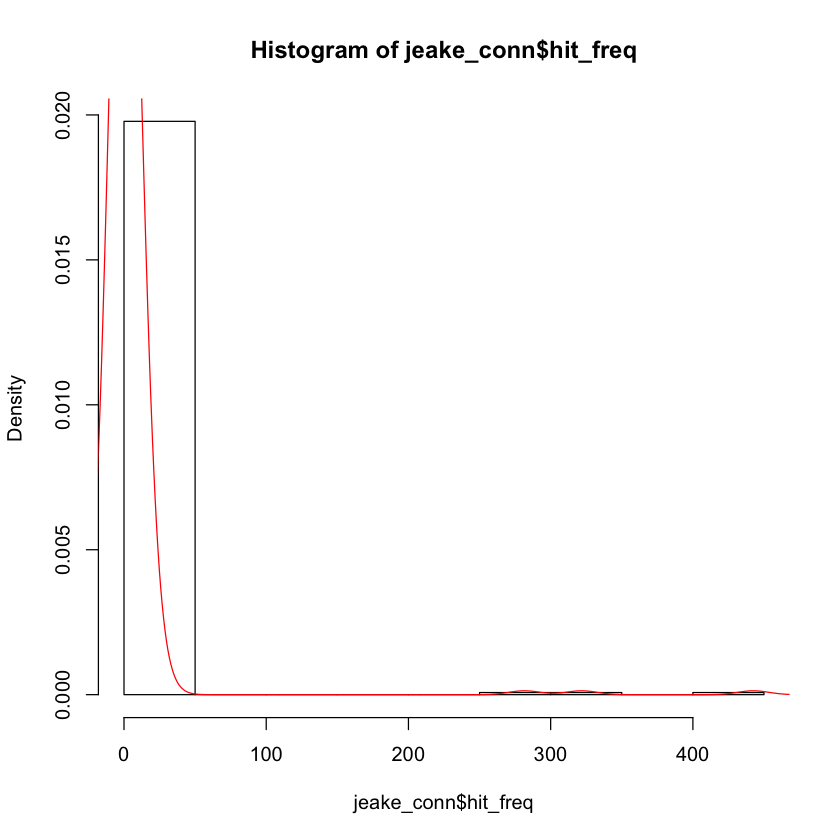

In [13]:
hist(jeake_conn$hit_freq,
    freq=FALSE)
lines(density(jeake_conn$hit_freq), col='red')

In [6]:
# test for normality

shapiro.test(jeake_conn$hit_freq)


	Shapiro-Wilk normality test

data:  jeake_conn$hit_freq
W = 0.11357, p-value < 2.2e-16


The data is not normally distributed. 

### 1 Generalised linear model using "connection" as a predictor and "hit_freq" as response variable

In [7]:
j_conn_model <- glm(hit_freq ~ connection,
                    data=jeake_conn,
                    family=quasipoisson)

summary(j_conn_model)
summary(j_conn_model)$coef


Call:
glm(formula = hit_freq ~ connection, family = quasipoisson, data = jeake_conn)

Deviance Residuals: 
    Min       1Q   Median       3Q      Max  
-22.451   -1.730   -1.334   -1.334   10.148  

Coefficients:
                           Estimate Std. Error t value Pr(>|t|)    
(Intercept)                  0.7653     0.4592   1.666   0.0968 .  
connectionBUSINESS; FRIEND   0.2397     0.5935   0.404   0.6866    
connectionEXTENDED FAMILY   -0.3616     0.5809  -0.622   0.5342    
connectionFAMILY            -0.8819     0.5318  -1.658   0.0984 .  
connectionFRIEND             4.8026     0.4699  10.220   <2e-16 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

(Dispersion parameter for quasipoisson family taken to be 10.42628)

    Null deviance: 9280.4  on 271  degrees of freedom
Residual deviance: 1936.9  on 267  degrees of freedom
AIC: NA

Number of Fisher Scoring iterations: 7


,Estimate,Std. Error,t value,Pr(>|t|)
(Intercept),0.7652656,0.4592246,1.6664299,9.680046e-02
connectionBUSINESS; FRIEND,0.2397141,0.5934992,0.4038997,6.866098e-01
connectionEXTENDED FAMILY,-0.3616203,0.5809443,-0.6224699,5.341642e-01
connectionFAMILY,-0.8818683,0.5317545,-1.6584126,9.840849e-02
connectionFRIEND,4.8025826,0.4699371,10.2196279,6.587869e-21


In [8]:
"------------------------------drop1------------------------------"
drop1(j_conn_model, test = "LR")

"------------------------------anova------------------------------"
simpler_j_conn <- glm(hit_freq ~ 1, data=jeake_conn,
                      family=quasipoisson)
anova(simpler_j_conn, j_conn_model, test = "LR")

[1] "------------------------------drop1------------------------------"

,Df,Deviance,scaled dev.,Pr(>Chi)
<none>,NA,1936.876,NA,NA
connection,4,9280.356,704.3244,4.035311e-151


[1] "------------------------------anova------------------------------"

Resid. Df,Resid. Dev,Df,Deviance,Pr(>Chi)
271,9280.356,NA,NA,NA
267,1936.876,4,7343.48,4.035311e-151


In [9]:
eff <- effect("connection", j_conn_model)
eff


 connection effect
connection
BUSINESS; CORRESPONDENT        BUSINESS; FRIEND         EXTENDED FAMILY 
              2.1495652               2.7318519               1.4972727 
                 FAMILY                  FRIEND 
              0.8899387             261.8700000 

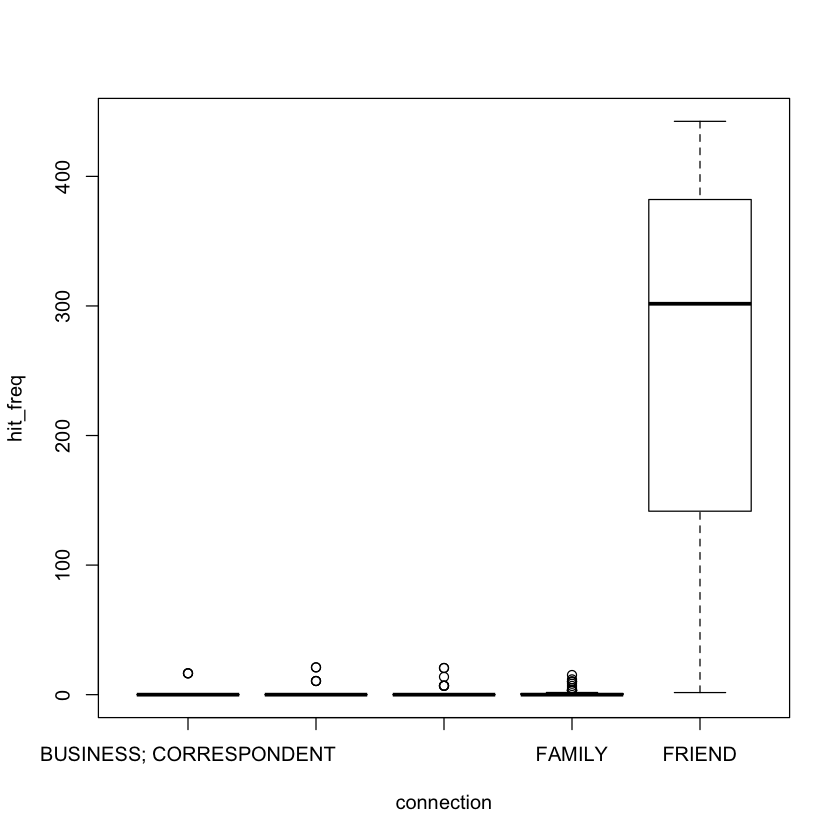

In [10]:
plot(hit_freq ~ connection, data=jeake_conn)

par(cex.axis = 0.8)

options(repr.plot.width = 14, repr.plot.height = 8)

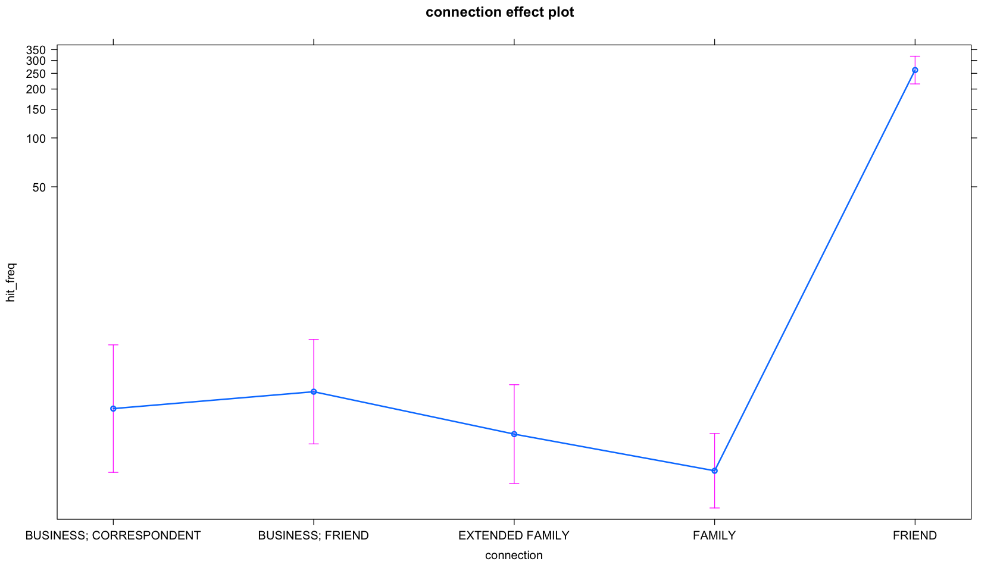

In [11]:
plot(eff)
 
par(cex.axis = 0.8)

# Increase the resolution of the plot (in inches)
options(repr.plot.width = 12, repr.plot.height = 6)

Given that the "Friend" term is constructed from four letter writings, it might be treated as an outlier. Let's run the same model without the term.

### 1.1 Generalised linear model using "connection" as a predictor, without "FRIEND", and "hit_freq" as response variable

In [6]:
# make sure it doesn't delete the "BUSINESS; FRIEND" variable as well
jeake_nofriend <- subset(jeake_conn, !(grepl("FRIEND", connection) & connection != "BUSINESS; FRIEND"))
jeake_nofriend$connection <- droplevels(jeake_nofriend$connection)

str(jeake_nofriend$connection)

 Factor w/ 4 levels "BUSINESS; CORRESPONDENT",..: 4 4 4 4 4 4 4 4 4 4 ...


In [54]:
j_nofriend_model <- glm(hit_freq ~ connection,
                        data=jeake_nofriend,
                        family=quasipoisson)

summary(j_nofriend_model)
summary(j_nofriend_model)$coef


Call:
glm(formula = hit_freq ~ connection, family = quasipoisson, data = jeake_nofriend)

Deviance Residuals: 
   Min      1Q  Median      3Q     Max  
-2.337  -1.730  -1.334  -1.334   8.352  

Coefficients:
                           Estimate Std. Error t value Pr(>|t|)  
(Intercept)                  0.7653     0.4275   1.790   0.0746 .
connectionBUSINESS; FRIEND   0.2397     0.5525   0.434   0.6647  
connectionEXTENDED FAMILY   -0.3616     0.5408  -0.669   0.5043  
connectionFAMILY            -0.8819     0.4950  -1.781   0.0760 .
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

(Dispersion parameter for quasipoisson family taken to be 9.035648)

    Null deviance: 1383.8  on 267  degrees of freedom
Residual deviance: 1315.6  on 264  degrees of freedom
AIC: NA

Number of Fisher Scoring iterations: 7


,Estimate,Std. Error,t value,Pr(>|t|)
(Intercept),0.7652656,0.4275040,1.7900781,0.07458727
connectionBUSINESS; FRIEND,0.2397141,0.5525037,0.4338688,0.66473807
connectionEXTENDED FAMILY,-0.3616203,0.5408160,-0.6686568,0.50429866
connectionFAMILY,-0.8818683,0.4950240,-1.7814659,0.07598591


In [14]:
"------------------------------drop1------------------------------"
drop1(j_nofriend_model, test = "LR")

"------------------------------anova------------------------------"
simpler_j_nofriend <- glm(hit_freq ~ 1, data=jeake_nofriend,
                          family=quasipoisson)
anova(simpler_j_nofriend, j_nofriend_model, test = "LR")

[1] "------------------------------drop1------------------------------"

,Df,Deviance,scaled dev.,Pr(>Chi)
<none>,NA,1315.648,NA,NA
connection,3,1383.815,7.544184,0.05643397


[1] "------------------------------anova------------------------------"

Resid. Df,Resid. Dev,Df,Deviance,Pr(>Chi)
267,1383.815,NA,NA,NA
264,1315.648,3,68.1666,0.05643397


The exclusion of the "FRIEND" parameter in the model does not make the model worse.

In [15]:
eff <- effect("connection", j_nofriend_model)
eff


 connection effect
connection
BUSINESS; CORRESPONDENT        BUSINESS; FRIEND         EXTENDED FAMILY 
              2.1495652               2.7318519               1.4972727 
                 FAMILY 
              0.8899387 

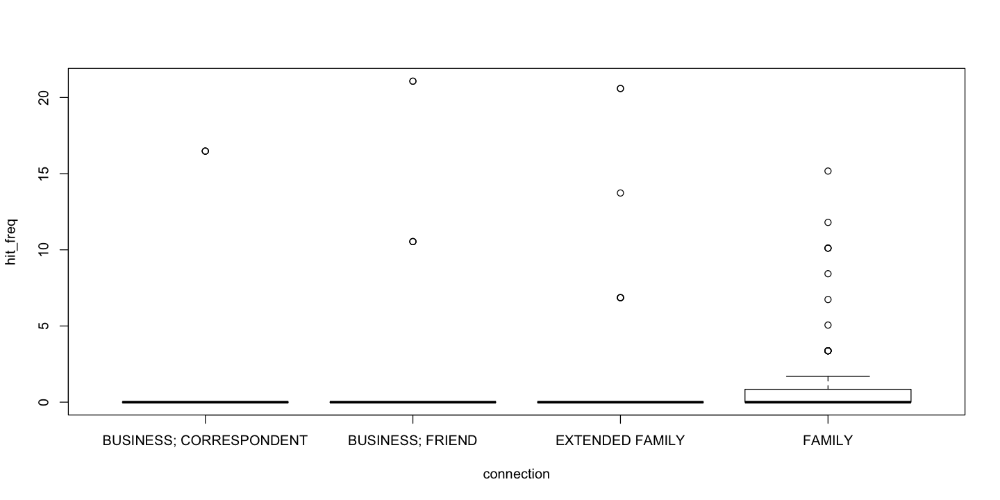

In [16]:
plot(hit_freq ~ connection, data=jeake_nofriend)

par(cex.axis = 0.8)

options(repr.plot.width = 14, repr.plot.height = 8)

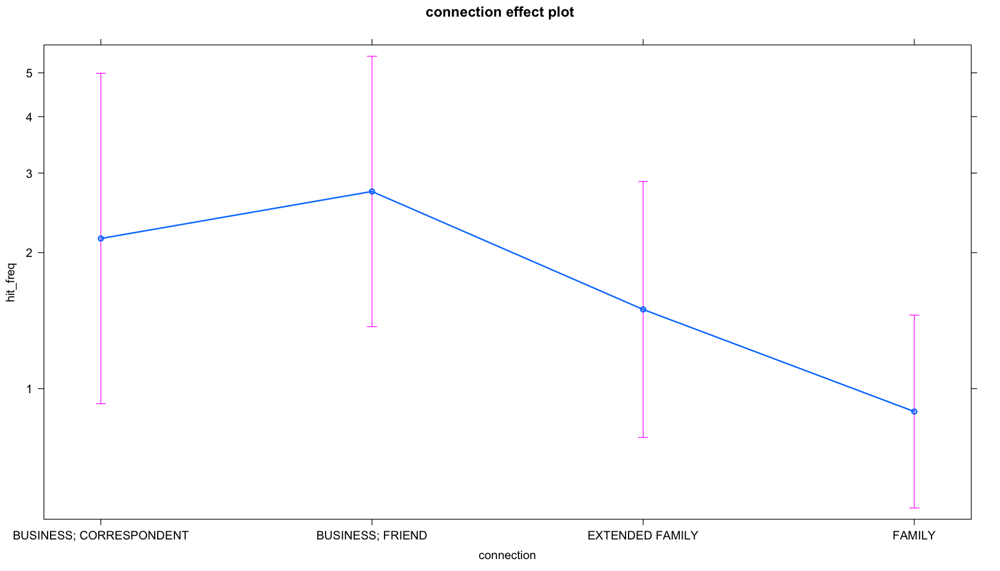

In [17]:
plot(eff)
 
par(cex.axis = 0.8)

# Increase the resolution of the plot (in inches)
options(repr.plot.width = 10, repr.plot.height = 6)

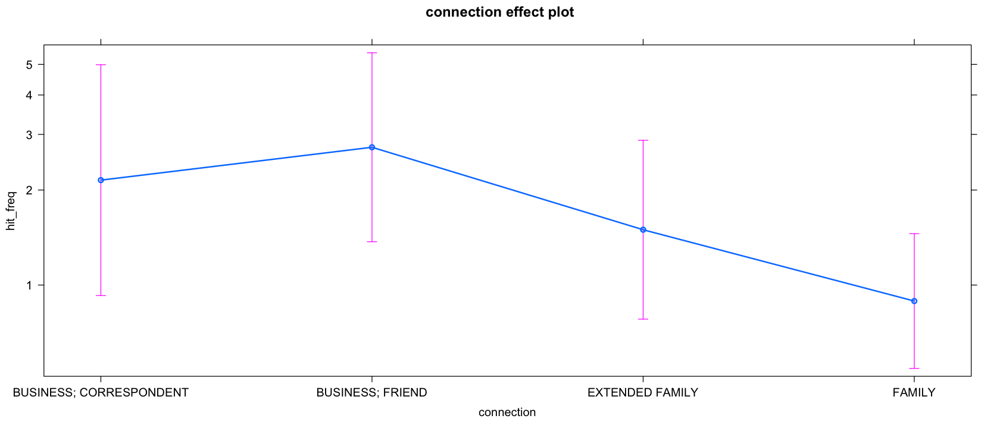

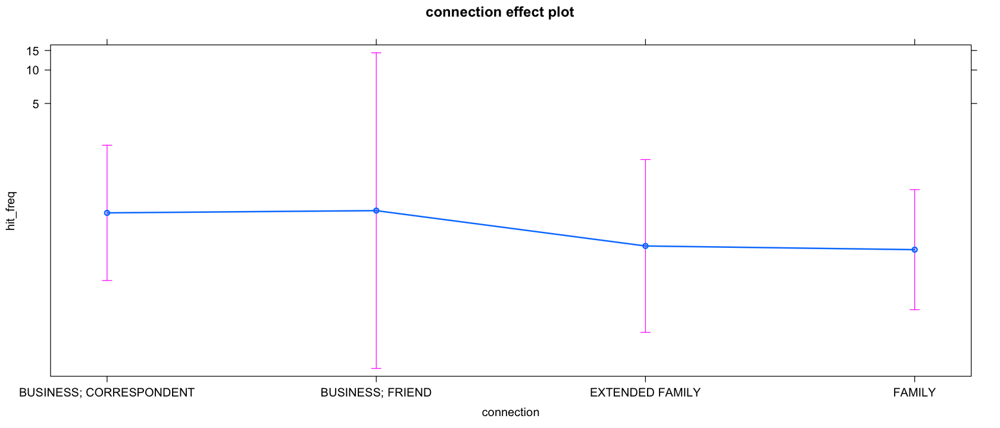

In [55]:
plot(effect("connection", j_nofriend_model))
plot(effect("connection", j_glmer1g))

par(cex.axis = 0.8)

options(repr.plot.width = 14, repr.plot.height = 6)

### 2.1 Generalised linear mixed-effects model using "connection" as a fixed effect and "sender" as a random effect, negative binomial

Generalized linear mixed model fit by maximum likelihood (Adaptive
  Gauss-Hermite Quadrature, nAGQ = 0) [glmerMod]
 Family: Negative Binomial(1)  ( log )
Formula: hit_freq ~ connection + (1 | sender)
   Data: jeake_conn

     AIC      BIC   logLik deviance df.resid 
   806.7    831.9   -396.3    792.7      265 

Scaled residuals: 
    Min      1Q  Median      3Q     Max 
-0.9355 -0.7472 -0.5839 -0.3589  9.7868 

Random effects:
 Groups Name        Variance Std.Dev.
 sender (Intercept) 3.553    1.885   
Number of obs: 272, groups:  sender, 33

Fixed effects:
                           Estimate Std. Error z value Pr(>|z|)    
(Intercept)                -0.15123    0.55991  -0.270   0.7871    
connectionBUSINESS; FRIEND -0.07231    1.61539  -0.045   0.9643    
connectionEXTENDED FAMILY  -0.56467    0.96370  -0.586   0.5579    
connectionFAMILY           -1.26472    0.50475  -2.506   0.0122 *  
connectionFRIEND            4.26846    0.81234   5.255 1.48e-07 ***
---
Signif. codes:  0 ‘***’

[1] "------------------------------dispersion------------------------------"

[1] 1.222563

[1] "------------------------------drop1------------------------------"

,Df,AIC,LRT,Pr(Chi)
<none>,NA,806.661,NA,NA
connection,4,1019.143,220.4822,1.476231e-46



 connection effect
connection
BUSINESS; CORRESPONDENT        BUSINESS; FRIEND         EXTENDED FAMILY 
              0.8596512               0.7996809               0.4887540 
                 FAMILY                  FRIEND 
              0.2426954              61.3889121 

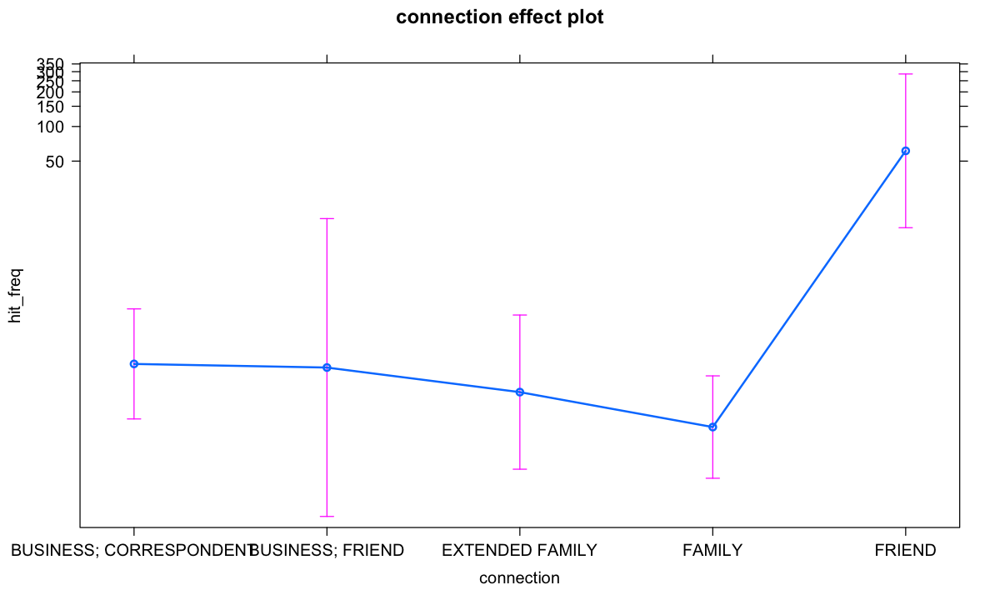

In [18]:
# negative binomial models are better at dealing with overdispersion

j_glmer1 <- glmer(hit_freq ~ connection + (1|sender),
                  data=jeake_conn,
                  family=negative.binomial(theta=1),
                  nAGQ=0L)
# setting theta to 1 makes the negative binomial distribution a poisson distribution,
# assuming equality between mean and variance
summary(j_glmer1)

"------------------------------dispersion------------------------------"
dispersion_glmer(j_glmer1)

"------------------------------drop1------------------------------"
drop1(j_glmer1, test = "Chisq")

effect("connection", j_glmer1)

plot(effect("connection", j_glmer1))

par(cex.axis = 0.8)

options(repr.plot.width = 14, repr.plot.height = 6)

### 2.2 Generalised linear mixed-effects model using "connection" as a fixed effect, and "pair" as a random effect, negative binomial

Generalized linear mixed model fit by maximum likelihood (Adaptive
  Gauss-Hermite Quadrature, nAGQ = 0) [glmerMod]
 Family: Negative Binomial(1)  ( log )
Formula: hit_freq ~ connection + (1 | pair)
   Data: jeake_conn

     AIC      BIC   logLik deviance df.resid 
   781.0    806.3   -383.5    767.0      265 

Scaled residuals: 
    Min      1Q  Median      3Q     Max 
-0.9347 -0.6424 -0.4726 -0.3270  9.8308 

Random effects:
 Groups Name        Variance Std.Dev.
 pair   (Intercept) 3.38     1.839   
Number of obs: 272, groups:  pair, 59

Fixed effects:
                           Estimate Std. Error z value Pr(>|z|)    
(Intercept)                 -1.0383     0.6678  -1.555    0.120    
connectionBUSINESS; FRIEND   0.3884     1.4897   0.261    0.794    
connectionEXTENDED FAMILY    0.1799     0.9884   0.182    0.856    
connectionFAMILY             0.3834     0.7976   0.481    0.631    
connectionFRIEND             5.8087     1.2443   4.668 3.04e-06 ***
---
Signif. codes:  0 ‘***’ 0.0

[1] "------------------------------dispersion------------------------------"

[1] 1.152836

[1] "------------------------------drop1------------------------------"

,Df,AIC,LRT,Pr(Chi)
<none>,NA,781.0186,NA,NA
connection,4,795.8550,22.83644,0.0001365175



 connection effect
connection
BUSINESS; CORRESPONDENT        BUSINESS; FRIEND         EXTENDED FAMILY 
              0.3540552               0.5220894               0.4238415 
                 FAMILY                  FRIEND 
              0.5194915             117.9605079 

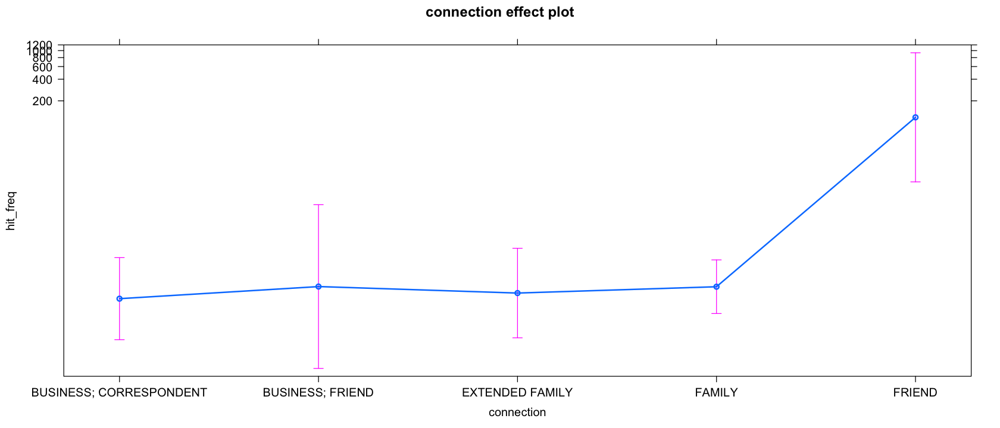

In [19]:
j_glmer1b <- glmer(hit_freq ~ connection + (1|pair),
                   data=jeake_conn,
                   family=negative.binomial(theta=1),
                   nAGQ=0L)

summary(j_glmer1b)

"------------------------------dispersion------------------------------"
dispersion_glmer(j_glmer1b)

"------------------------------drop1------------------------------"
drop1(j_glmer1b, test = "Chisq")

effect("connection", j_glmer1b)

plot(effect("connection", j_glmer1b))

par(cex.axis = 0.8)

options(repr.plot.width = 14, repr.plot.height = 6)

Using pair as a mixed effect rather than sender increases the significance of the BUSINESS;FRIEND variable. However, it's higher AIC score indicates that the model using "sender" as a mixed effect is a better fit.

### 2.3 Generalised linear mixed-effects model using "connection" as a fixed effect and "sender" as a random effect, without "FRIEND" variable

Generalized linear mixed model fit by maximum likelihood (Adaptive
  Gauss-Hermite Quadrature, nAGQ = 0) [glmerMod]
 Family: Negative Binomial(1)  ( log )
Formula: hit_freq ~ connection + (1 | sender)
   Data: jeake_nofriend

     AIC      BIC   logLik deviance df.resid 
   754.1    775.6   -371.0    742.1      262 

Scaled residuals: 
    Min      1Q  Median      3Q     Max 
-0.9347 -0.7455 -0.5842 -0.3944  9.7566 

Random effects:
 Groups Name        Variance Std.Dev.
 sender (Intercept) 3.17     1.78    
Number of obs: 268, groups:  sender, 31

Fixed effects:
                           Estimate Std. Error z value Pr(>|z|)  
(Intercept)                -0.07034    0.54664  -0.129    0.898  
connectionBUSINESS; FRIEND -0.10697    1.53686  -0.070    0.945  
connectionEXTENDED FAMILY  -0.60656    0.92424  -0.656    0.512  
connectionFAMILY           -1.21440    0.50399  -2.410    0.016 *
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Correlation of Fixed Effects:
   

[1] "------------------------------dispersion------------------------------"

[1] 1.229641

[1] "------------------------------drop1------------------------------"

,Df,AIC,LRT,Pr(Chi)
<none>,NA,754.0810,NA,NA
connection,3,754.6632,6.582248,0.08647469



 connection effect
connection
BUSINESS; CORRESPONDENT        BUSINESS; FRIEND         EXTENDED FAMILY 
              0.9320768               0.8375226               0.5081889 
                 FAMILY 
              0.2767214 

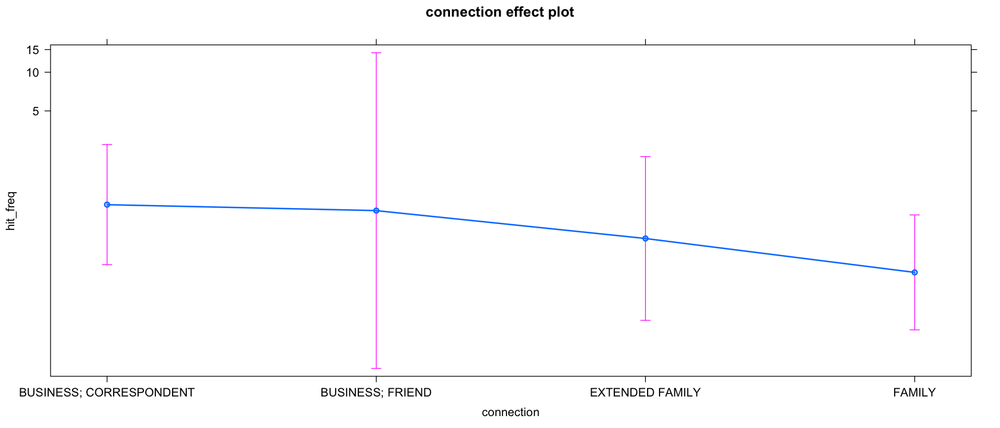

In [22]:
# experiment with running the same model without the friend variable
# to see how it impacts the sender variance

j_glmer1e <- glmer(hit_freq ~ connection + (1|sender),
                   data=jeake_nofriend,
                   family=negative.binomial(theta=1),
                   nAGQ=0L)

summary(j_glmer1e)

"------------------------------dispersion------------------------------"
dispersion_glmer(j_glmer1e)

"------------------------------drop1------------------------------"
drop1(j_glmer1e, test = "Chisq")

effect("connection", j_glmer1e)

plot(effect("connection", j_glmer1e))

par(cex.axis = 0.8)

options(repr.plot.width = 14, repr.plot.height = 6)

Without the "FRIEND" variable, there are no significant variables in the connection predictor. However, the lower AIC score suggest the model is a better fit than if the friend parameter was left in.

Removing the "FRIEND" variable while adding "sender" and "quinquennial" as random effects results in the best fitting model. "EXTENDED FAMILY" is borderline significant, but it doesn't reach the 0.05 treshold.

### 3.1 Generalised linear mixed-effects model using "connection" and "age_gap_over_20" as fixed effects and "sender" as random effect, negative binomial

In [30]:
# remove "UNK" and "MULT" values from age_gap_over_20 column
j_conn_gap <- jeake_conn[!(jeake_conn$age_gap_over_20 %in% c("MULT", "UNK")),  ]
j_conn_gap$age_gap_over_20 <- droplevels(j_conn_gap$age_gap_over_20)

levels(j_conn_gap$age_gap_over_20)
nrow(j_conn_gap)

[1] "FALSE" "TRUE"

[1] 186

Generalized linear mixed model fit by maximum likelihood (Adaptive
  Gauss-Hermite Quadrature, nAGQ = 0) [glmerMod]
 Family: Negative Binomial(1)  ( log )
Formula: hit_freq ~ connection + age_gap_over_20 + (1 | sender)
   Data: j_conn_gap

     AIC      BIC   logLik deviance df.resid 
   524.5    543.8   -256.2    512.5      180 

Scaled residuals: 
    Min      1Q  Median      3Q     Max 
-0.9343 -0.7193 -0.6720 -0.1235  7.1990 

Random effects:
 Groups Name        Variance Std.Dev.
 sender (Intercept) 0.02936  0.1714  
Number of obs: 186, groups:  sender, 12

Fixed effects:
                          Estimate Std. Error z value Pr(>|z|)    
(Intercept)                 1.1228     0.2908   3.860 0.000113 ***
connectionEXTENDED FAMILY  -0.1777     0.6112  -0.291 0.771219    
connectionFAMILY           -2.1629     0.4071  -5.313 1.08e-07 ***
age_gap_over_20TRUE         0.9566     0.3214   2.976 0.002921 ** 
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Correlation of

[1] "------------------------------dispersion------------------------------"

[1] 1.240854

[1] "------------------------------drop1------------------------------"

,Df,AIC,LRT,Pr(Chi)
<none>,NA,524.4927,NA,NA
connection,2,533.3710,12.878243,0.001597810
age_gap_over_20,1,531.2314,8.738641,0.003115366



 connection effect
connection
BUSINESS; FRIEND  EXTENDED FAMILY           FAMILY 
       5.3283436        4.4606929        0.6127256 


 age_gap_over_20 effect
age_gap_over_20
    FALSE      TRUE 
0.5034227 1.3102690 

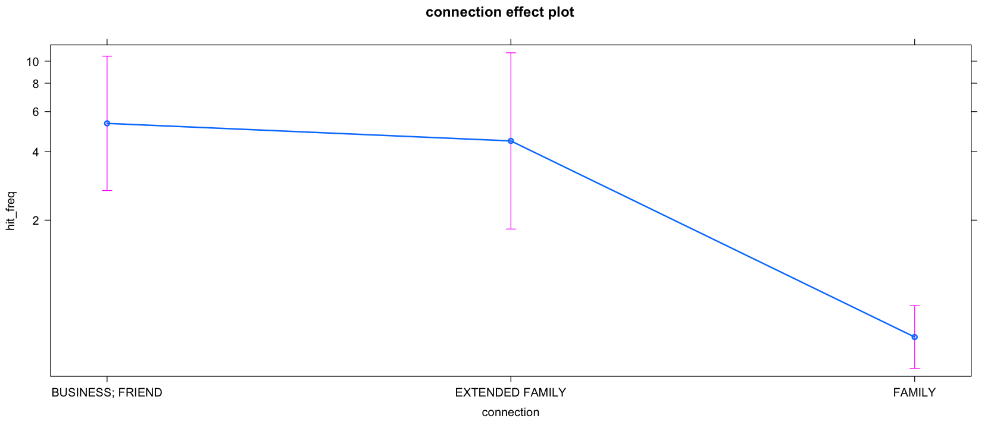

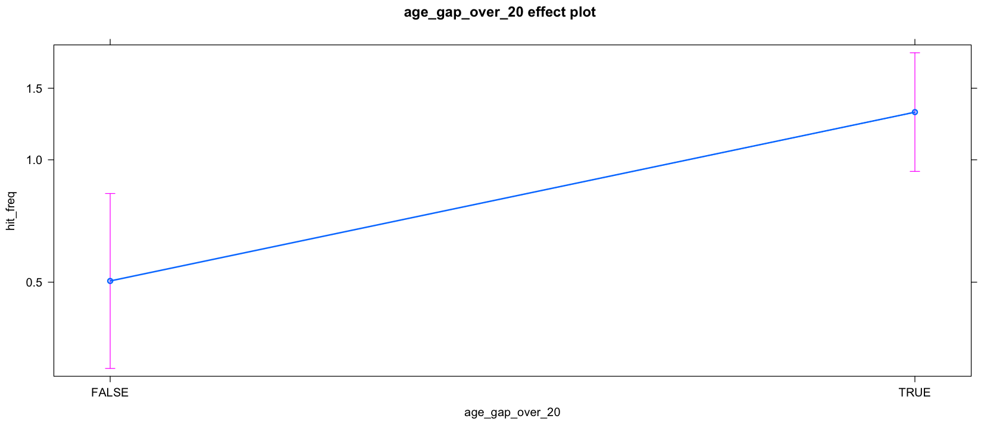

In [31]:
j_glmer3 <- glmer(hit_freq ~ connection + age_gap_over_20 + (1|sender),
                  data=j_conn_gap,
                  family=negative.binomial(theta = 1),
                  nAGQ=0L)
summary(j_glmer3)

"------------------------------dispersion------------------------------"
dispersion_glmer(j_glmer3)

"------------------------------drop1------------------------------"
drop1(j_glmer3, test = "Chisq")

effect("connection", j_glmer3)
effect("age_gap_over_20", j_glmer3)

plot(effect("connection", j_glmer3))
plot(effect("age_gap_over_20", j_glmer3))

par(cex.axis = 0.8)

options(repr.plot.width = 14, repr.plot.height = 6)

"age_gap_over_20" is a significant predictor. There is a moderate negative correlation with "FAMILY", so if the age gap within this connection group is larger than 20 years, the number of divine appeals decrease. However, given that the effect is small compared to the other variables, the impact on the hit frequency is low.

### 3.2 Generalised linear mixed-effects model using "connection" and "age_gap_over_20" as fixed effects, and "pair" as a random effect, negative binomial

Generalized linear mixed model fit by maximum likelihood (Adaptive
  Gauss-Hermite Quadrature, nAGQ = 0) [glmerMod]
 Family: Negative Binomial(1)  ( log )
Formula: hit_freq ~ connection + age_gap_over_20 + (1 | pair)
   Data: j_conn_gap

     AIC      BIC   logLik deviance df.resid 
   519.9    539.3   -254.0    507.9      180 

Scaled residuals: 
    Min      1Q  Median      3Q     Max 
-0.9349 -0.7477 -0.5285 -0.1302  6.2118 

Random effects:
 Groups Name        Variance Std.Dev.
 pair   (Intercept) 0.3182   0.5641  
Number of obs: 186, groups:  pair, 24

Fixed effects:
                          Estimate Std. Error z value Pr(>|z|)   
(Intercept)                1.12276    0.61107   1.837  0.06616 . 
connectionEXTENDED FAMILY  0.01162    0.98978   0.012  0.99064   
connectionFAMILY          -2.00237    0.72439  -2.764  0.00571 **
age_gap_over_20TRUE        0.54645    0.47181   1.158  0.24678   
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Correlation of Fixed Ef

[1] "------------------------------dispersion------------------------------"

[1] 1.207249

[1] "------------------------------drop1------------------------------"

,Df,AIC,LRT,Pr(Chi)
<none>,NA,519.9242,NA,NA
connection,2,524.3681,8.443906,0.01466996
age_gap_over_20,1,519.0568,1.132604,0.28722066



 connection effect
connection
BUSINESS; FRIEND  EXTENDED FAMILY           FAMILY 
       4.2085535        4.2577260        0.5682162 


 age_gap_over_20 effect
age_gap_over_20
    FALSE      TRUE 
0.5795846 1.0010079 

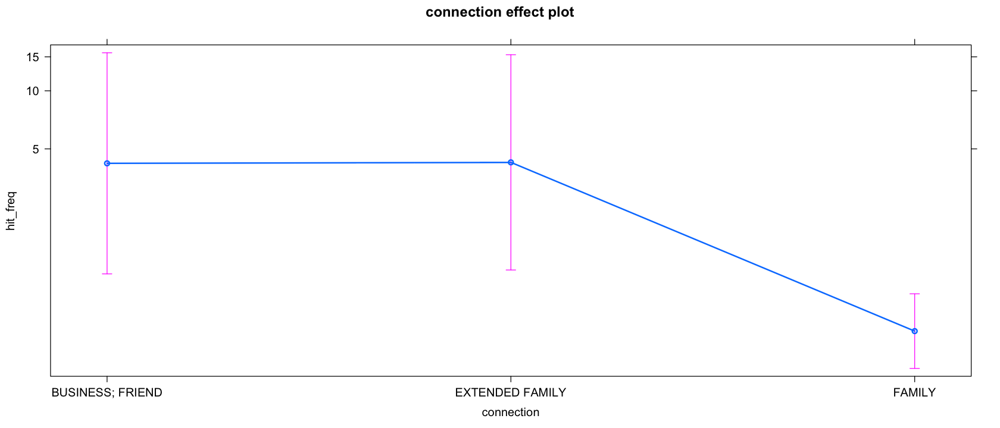

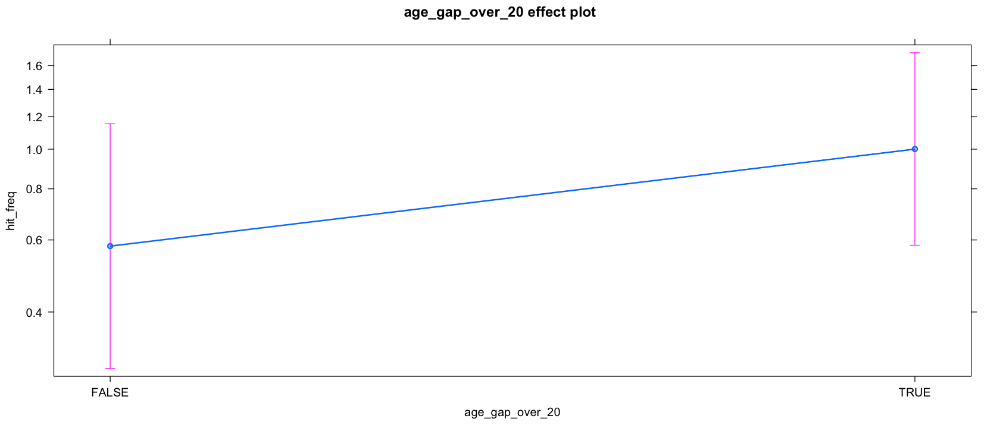

In [32]:
j_glmer3b <- glmer(hit_freq ~ connection + age_gap_over_20 + (1|pair),
                  data=j_conn_gap,
                  family=negative.binomial(theta = 1),
                  nAGQ=0L)
summary(j_glmer3b)

"------------------------------dispersion------------------------------"
dispersion_glmer(j_glmer3b)

"------------------------------drop1------------------------------"
drop1(j_glmer3b, test = "Chisq")

effect("connection", j_glmer3b)
effect("age_gap_over_20", j_glmer3b)

plot(effect("connection", j_glmer3b))
plot(effect("age_gap_over_20", j_glmer3b))

par(cex.axis = 0.8)

options(repr.plot.width = 14, repr.plot.height = 6)

"age_gap_over_20" is no longer a significant predictor when the mixed effect is replaced with correspondent pairs rather than the sender.

#### Preprocess columns from the "nofriend" subset

In [24]:
# remove "UNK" and "MULT" values from age_gap_over_20 column
jnf_gap <- jeake_nofriend[!(jeake_nofriend$age_gap_over_20 %in% c("MULT", "UNK")),  ]
jnf_gap$age_gap_over_20 <- droplevels(jnf_gap$age_gap_over_20)

# remove "UNK" and "MULT" values from sender_is_older column
jnf_old <- jeake_nofriend[!(jeake_nofriend$sender_is_older %in% c("MULT", "UNK")),  ]
jnf_old$sender_is_older <- droplevels(jnf_old$sender_is_older)

# remove "UNK" and "MULT" values from sender_over_40 column
jnf_se40 <- jeake_nofriend[!(jeake_nofriend$sender_over_40 %in% c("MULT", "UNK")),  ]
jnf_se40$sender_over_40 <- droplevels(jnf_se40$sender_over_40)

# remove "UNK" and "MULT" values from addressee_over_40 column
jnf_ad40 <- jeake_nofriend[!(jeake_nofriend$addressee_over_40 %in% c("MULT", "UNK")),  ]
jnf_ad40$addressee_over_40 <- droplevels(jnf_ad40$addressee_over_40)

# remove multigender values from gender_pair column
jnf_gender <- jeake_nofriend[!(jeake_nofriend$gender_pair %in% c("FEMALE-MULT", "MALE-MULT")),  ]
jnf_gender$gender_pair <- droplevels(jnf_gender$gender_pair)

"gender_pair:"
levels(jnf_gender$gender_pair)
nrow(jnf_gender)

"addressee_over_40:"
levels(jnf_ad40$addressee_over_40)
nrow(jnf_ad40)

"sender_over_40:"
levels(jnf_se40$sender_over_40)
nrow(jnf_se40)

"sender_is_older:"
levels(jnf_old$sender_is_older)
nrow(jnf_old)

"age_gap_over_20:"
levels(jnf_gap$age_gap_over_20)
nrow(jnf_gap)

[1] "gender_pair:"

[1] "FEMALE-FEMALE" "FEMALE-MALE"   "MALE-FEMALE"   "MALE-MALE"

[1] 266

[1] "addressee_over_40:"

[1] "FALSE" "TRUE"

[1] 257

[1] "sender_over_40:"

[1] "FALSE" "TRUE"

[1] 210

[1] "sender_is_older:"

[1] "FALSE" "TRUE"

[1] 191

[1] "age_gap_over_20:"

[1] "FALSE" "TRUE"

[1] 186

"age_gap_over_20" is a significant predictor. There is a negative moderate correlation with "FAMILY", suggesting that the frequency of divine appeals decreases if the age gap in family connections is over twenty years.

### 4.1 Generalised linear mixed-effects model using "connection" and "age_gap_over_20" as fixed effects, and "sender" and "quinquennial" as random effects, negative binomial, without "FRIEND" variable (BEST FIT, but "FRIEND" was already pruned by removing "UNK" and "MULT" values

Generalized linear mixed model fit by maximum likelihood (Adaptive
  Gauss-Hermite Quadrature, nAGQ = 0) [glmerMod]
 Family: Negative Binomial(1)  ( log )
Formula: hit_freq ~ connection + age_gap_over_20 + (1 | sender)
   Data: jnf_gap

     AIC      BIC   logLik deviance df.resid 
   524.5    543.8   -256.2    512.5      180 

Scaled residuals: 
    Min      1Q  Median      3Q     Max 
-0.9343 -0.7193 -0.6720 -0.1235  7.1990 

Random effects:
 Groups Name        Variance Std.Dev.
 sender (Intercept) 0.02936  0.1714  
Number of obs: 186, groups:  sender, 12

Fixed effects:
                          Estimate Std. Error z value Pr(>|z|)    
(Intercept)                 1.1228     0.2908   3.860 0.000113 ***
connectionEXTENDED FAMILY  -0.1777     0.6112  -0.291 0.771219    
connectionFAMILY           -2.1629     0.4071  -5.313 1.08e-07 ***
age_gap_over_20TRUE         0.9566     0.3214   2.976 0.002921 ** 
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Correlation of Fi

[1] "------------------------------dispersion------------------------------"

[1] 1.240854

[1] "------------------------------drop1------------------------------"

,Df,AIC,LRT,Pr(Chi)
<none>,NA,524.4927,NA,NA
connection,2,533.3710,12.878243,0.001597810
age_gap_over_20,1,531.2314,8.738641,0.003115366



 connection effect
connection
BUSINESS; FRIEND  EXTENDED FAMILY           FAMILY 
       5.3283436        4.4606929        0.6127256 


 age_gap_over_20 effect
age_gap_over_20
    FALSE      TRUE 
0.5034227 1.3102690 

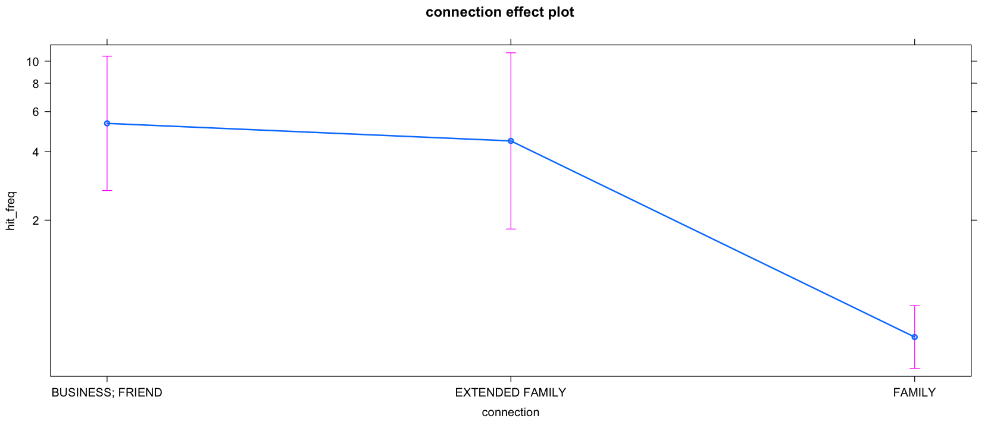

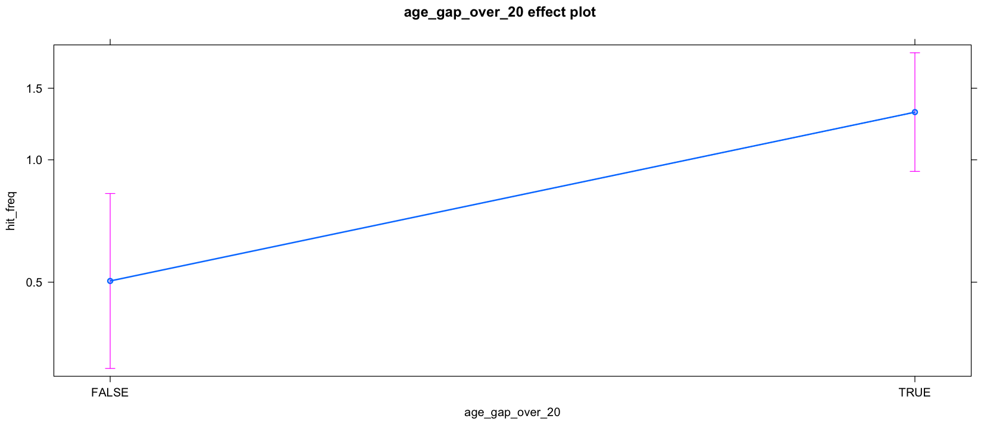

In [49]:
j_glmer3f <- glmer(hit_freq ~ connection + age_gap_over_20 + (1|sender),
                  data=jnf_gap,
                  family=negative.binomial(theta = 1),
                  nAGQ=0L)
summary(j_glmer3f)

"------------------------------dispersion------------------------------"
dispersion_glmer(j_glmer3f)

"------------------------------drop1------------------------------"
drop1(j_glmer3f, test = "Chisq")

effect("connection", j_glmer3f)
effect("age_gap_over_20", j_glmer3f)

plot(effect("connection", j_glmer3f))
plot(effect("age_gap_over_20", j_glmer3f))

par(cex.axis = 0.8)

options(repr.plot.width = 14, repr.plot.height = 6)

Returns the exact same result as the model's counterpart using jeake_conn dataset rather than the jnf_gap dataset. The "friend" variable was already removed in the process pruning the "age_gap_over_20" of its "UNK" and "MULT" values. The more complex models return 0 variance on their random effects, making this one (and the first in the series the best fit. 

### 5.1 Generalised linear mixed-effects model using "connection" and "sender_is_older" as fixed effects and "sender" as random effect, negative binomial

In [38]:
# remove "UNK" and "MULT" values from sender_is_older column
j_conn_old <- jeake_conn[!(jeake_conn$sender_is_older %in% c("MULT", "UNK")),  ]
j_conn_old$sender_is_older <- droplevels(j_conn_old$sender_is_older)

levels(j_conn_old$sender_is_older)
nrow(j_conn_old)

[1] "FALSE" "TRUE"

[1] 192

In [39]:
j_glmer4 <- glmer(hit_freq ~ connection + sender_is_older + (1|sender),
                  data=j_conn_old,
                  family=negative.binomial(theta = 1),
                  nAGQ=0L)
summary(j_glmer4)

"------------------------------dispersion------------------------------"
dispersion_glmer(j_glmer4)

"------------------------------drop1------------------------------"
drop1(j_glmer4, test = "Chisq")

effect("connection", j_glmer4)
effect("sender_is_older", j_glmer4)

Generalized linear mixed model fit by maximum likelihood (Adaptive
  Gauss-Hermite Quadrature, nAGQ = 0) [glmerMod]
 Family: Negative Binomial(1)  ( log )
Formula: hit_freq ~ connection + sender_is_older + (1 | sender)
   Data: j_conn_old

     AIC      BIC   logLik deviance df.resid 
   544.5    570.6   -264.3    528.5      184 

Scaled residuals: 
    Min      1Q  Median      3Q     Max 
-0.9351 -0.7044 -0.6664 -0.0109  7.7348 

Random effects:
 Groups Name        Variance Std.Dev.
 sender (Intercept) 0.02041  0.1428  
Number of obs: 192, groups:  sender, 13

Fixed effects:
                            Estimate Std. Error z value Pr(>|z|)  
(Intercept)                 -15.7273  1629.2615  -0.010   0.9923  
connectionBUSINESS; FRIEND   16.2185  1629.2615   0.010   0.9921  
connectionEXTENDED FAMILY    17.0210  1629.2615   0.010   0.9917  
connectionFAMILY             14.9354  1629.2615   0.009   0.9927  
connectionFRIEND             15.5782  1629.2620   0.010   0.9924  
sender_is_older

[1] "------------------------------dispersion------------------------------"

Warning message in sqrt(object$devResid()):
“NaNs produced”Warning message in sqrt(object$devResid()):
“NaNs produced”

[1] NaN

[1] "------------------------------drop1------------------------------"

,Df,AIC,LRT,Pr(Chi)
<none>,NA,544.5144,NA,NA
connection,4,551.9329,15.418479,0.00390751
sender_is_older,1,545.9460,3.431596,0.06396025



 connection effect
connection
BUSINESS; CORRESPONDENT        BUSINESS; FRIEND         EXTENDED FAMILY 
           2.335031e-07            2.581651e+00            5.760218e+00 
                 FAMILY                  FRIEND 
           7.156025e-01            1.360827e+00 


 sender_is_older effect
sender_is_older
    FALSE      TRUE 
0.5326629 1.0016837 

In [40]:
plot(effect("connection", j_glmer4))
plot(effect("sender_is_older", j_glmer4))

par(cex.axis = 0.8)

options(repr.plot.width = 14, repr.plot.height = 6)

ERROR: Error in grid::grid.pretty(range.labels): infinite axis extents [GEPretty(2.22045e-16,inf,5)]


The effects cannot be plotted. It seems that the model is suffering from perfect separations, causing extremely high standard errors and perfect correlations. Given that there are only 197 useable data points available for the sender_is_older variable, it is possible that the scarcity disables the model from making meaningful estimations with the given predictors/effects. 

### 5.2 Generalised linear model using "connection" and "sender_is_older" as predictors, quasipoisson

In [41]:
j_glm4b <- glm(hit_freq ~ connection + sender_is_older,
               data=j_conn_old,
               family=quasipoisson)

summary(j_glm4b)

"------------------------------dispersion------------------------------"
279.03 / 179

"------------------------------drop1------------------------------"
drop1(j_glm4b, test = "Chisq")

effect("connection", j_glm4b)
effect("sender_is_older", j_glm4b)


Call:
glm(formula = hit_freq ~ connection + sender_is_older, family = quasipoisson, 
    data = j_conn_old)

Deviance Residuals: 
   Min      1Q  Median      3Q     Max  
-3.864  -1.357  -1.357  -0.169   6.718  

Coefficients:
                            Estimate Std. Error t value Pr(>|t|)
(Intercept)                 -13.3026  1089.2662  -0.012    0.990
connectionBUSINESS; FRIEND   13.5930  1089.2664   0.012    0.990
connectionEXTENDED FAMILY    14.4805  1089.2664   0.013    0.989
connectionFAMILY             12.3869  1089.2664   0.011    0.991
connectionFRIEND             12.9526  1089.2679   0.012    0.991
sender_is_olderTRUE           0.8324     0.5195   1.602    0.111

(Dispersion parameter for quasipoisson family taken to be 5.386706)

    Null deviance: 875.04  on 191  degrees of freedom
Residual deviance: 689.03  on 186  degrees of freedom
AIC: NA

Number of Fisher Scoring iterations: 11


[1] "------------------------------dispersion------------------------------"

[1] 1.558827

[1] "------------------------------drop1------------------------------"

,Df,Deviance,scaled dev.,Pr(>Chi)
<none>,NA,689.0277,NA,NA
connection,4,827.5015,25.70657,3.626111e-05
sender_is_older,1,705.6235,3.08088,7.921767e-02



 connection effect
connection
BUSINESS; CORRESPONDENT        BUSINESS; FRIEND         EXTENDED FAMILY 
           3.051187e-06            2.442427e+00            5.932879e+00 
                 FAMILY                  FRIEND 
           7.311944e-01            1.287440e+00 


 sender_is_older effect
sender_is_older
    FALSE      TRUE 
0.4722898 1.0856871 

In [42]:
plot(effect("connection", j_glm4b))
plot(effect("sender_is_older", j_glm4b))

par(cex.axis = 0.8)

options(repr.plot.width = 14, repr.plot.height = 6)

ERROR: Error in grid::grid.pretty(range.labels): infinite axis extents [GEPretty(2.22045e-16,inf,5)]


Once again, we run into the same problem.

"sender_over_40" becomes a highly significant predictor once pairs are taken into account rather than individual senders. There is a positive weak correlation with the FRIEND variable.

### 6.1 Generalised linear mixed-effects model using "connection" and "sender_over_40" as fixed effects, and "sender" as random effects, negative binomial

Generalized linear mixed model fit by maximum likelihood (Adaptive
  Gauss-Hermite Quadrature, nAGQ = 0) [glmerMod]
 Family: Negative Binomial(1)  ( log )
Formula: hit_freq ~ connection + sender_over_40 + (1 | sender)
   Data: jnf_se40

     AIC      BIC   logLik deviance df.resid 
   604.7    628.2   -295.4    590.7      203 

Scaled residuals: 
    Min      1Q  Median      3Q     Max 
-0.9290 -0.7498 -0.5455 -0.3054  6.8616 

Random effects:
 Groups Name        Variance Std.Dev.
 sender (Intercept) 1.49     1.221   
Number of obs: 210, groups:  sender, 14

Fixed effects:
                           Estimate Std. Error z value Pr(>|z|)    
(Intercept)                  1.5417     0.7251   2.126 0.033484 *  
connectionBUSINESS; FRIEND  -1.2291     1.5075  -0.815 0.414906    
connectionEXTENDED FAMILY   -2.5646     1.1512  -2.228 0.025903 *  
connectionFAMILY            -2.2877     0.6293  -3.635 0.000278 ***
sender_over_40TRUE           0.7785     0.3537   2.201 0.027736 *  
---
Signif. 

[1] "------------------------------dispersion------------------------------"

[1] 1.227512

[1] "------------------------------drop1------------------------------"

,Df,AIC,LRT,Pr(Chi)
<none>,NA,604.7480,NA,NA
connection,3,616.5504,17.802409,0.0004831087
sender_over_40,1,608.2011,5.453146,0.0195331252



 connection effect
connection
BUSINESS; CORRESPONDENT        BUSINESS; FRIEND         EXTENDED FAMILY 
              7.4819810               2.1889545               0.5757471 
                 FAMILY 
              0.7594213 


 sender_over_40 effect
sender_over_40
    FALSE      TRUE 
0.5547424 1.2083569 

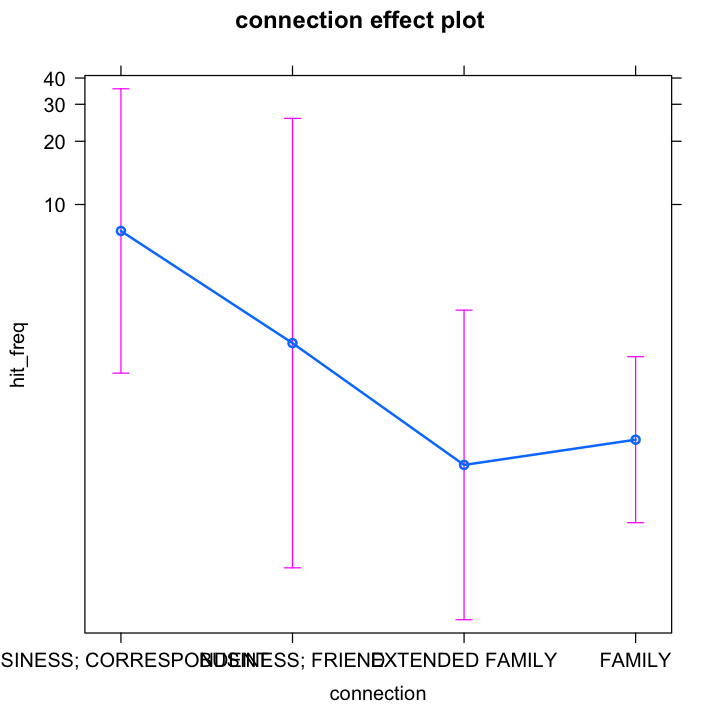

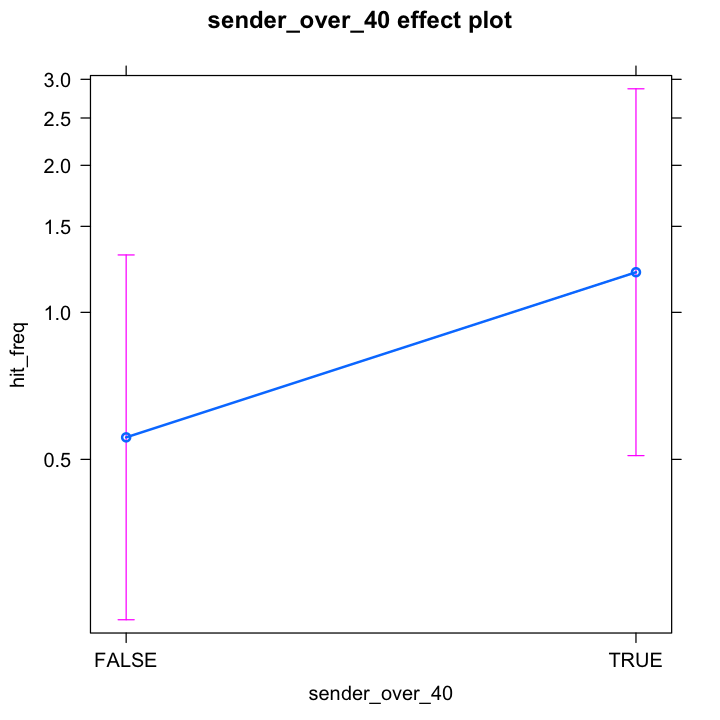

In [40]:
j_glmer5e <- glmer(hit_freq ~ connection + sender_over_40 + (1|sender),
                  data=jnf_se40,
                  family=negative.binomial(theta = 1),
                  nAGQ=0L)
summary(j_glmer5e)

"------------------------------dispersion------------------------------"
dispersion_glmer(j_glmer5e)

"------------------------------drop1------------------------------"
drop1(j_glmer5e, test = "Chisq")

effect("connection", j_glmer5e)
effect("sender_over_40", j_glmer5e)

plot(effect("connection", j_glmer5e))
plot(effect("sender_over_40", j_glmer5e))

par(cex.axis = 0.8)

options(repr.plot.width = 14, repr.plot.height = 6)

"sender_over_40" is a significant predictor. There is a negative weak correlation with "FAMILY". The "FAMILY" variable does not reach the 0.05 treshold for being significant.

### 6.2 Generalised linear mixed-effects model using "connection" and "sender_over_40" as fixed effects, and "pair" as random effects, negative binomial

Generalized linear mixed model fit by maximum likelihood (Adaptive
  Gauss-Hermite Quadrature, nAGQ = 0) [glmerMod]
 Family: Negative Binomial(1)  ( log )
Formula: hit_freq ~ connection + sender_over_40 + (1 | pair)
   Data: jnf_se40

     AIC      BIC   logLik deviance df.resid 
   585.8    609.2   -285.9    571.8      203 

Scaled residuals: 
    Min      1Q  Median      3Q     Max 
-0.9325 -0.7574 -0.4867 -0.2588  5.8849 

Random effects:
 Groups Name        Variance Std.Dev.
 pair   (Intercept) 2.414    1.554   
Number of obs: 210, groups:  pair, 36

Fixed effects:
                           Estimate Std. Error z value Pr(>|z|)
(Intercept)                 -0.4438     1.0451  -0.425    0.671
connectionBUSINESS; FRIEND   0.1493     1.7517   0.085    0.932
connectionEXTENDED FAMILY   -0.7346     1.4969  -0.491    0.624
connectionFAMILY            -0.3086     1.1355  -0.272    0.786
sender_over_40TRUE           0.5491     0.5595   0.981    0.326

Correlation of Fixed Effects:
         

[1] "------------------------------dispersion------------------------------"

[1] 1.148908

[1] "------------------------------drop1------------------------------"

,Df,AIC,LRT,Pr(Chi)
<none>,NA,585.7597,NA,NA
connection,3,580.1150,0.3553164,0.9493102
sender_over_40,1,584.8615,1.1018598,0.2938583



 connection effect
connection
BUSINESS; CORRESPONDENT        BUSINESS; FRIEND         EXTENDED FAMILY 
              0.8942986               1.0382724               0.4290137 
                 FAMILY 
              0.6568319 


 sender_over_40 effect
sender_over_40
    FALSE      TRUE 
0.4833447 0.8369667 

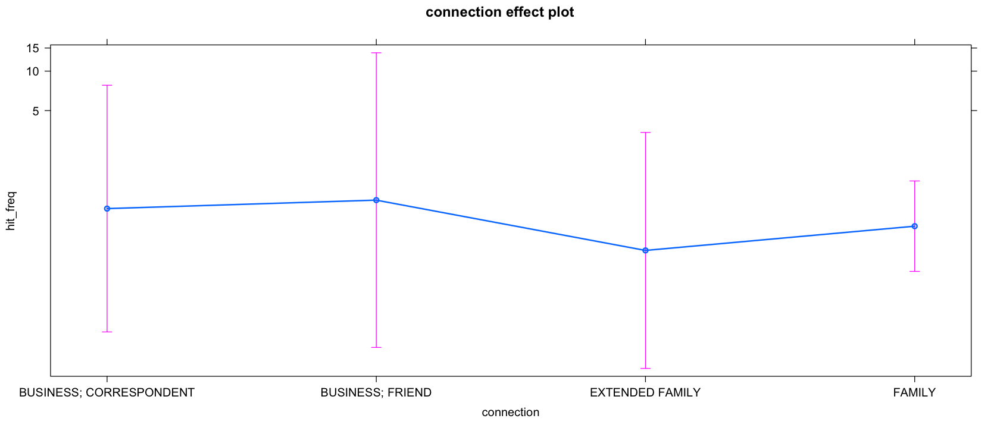

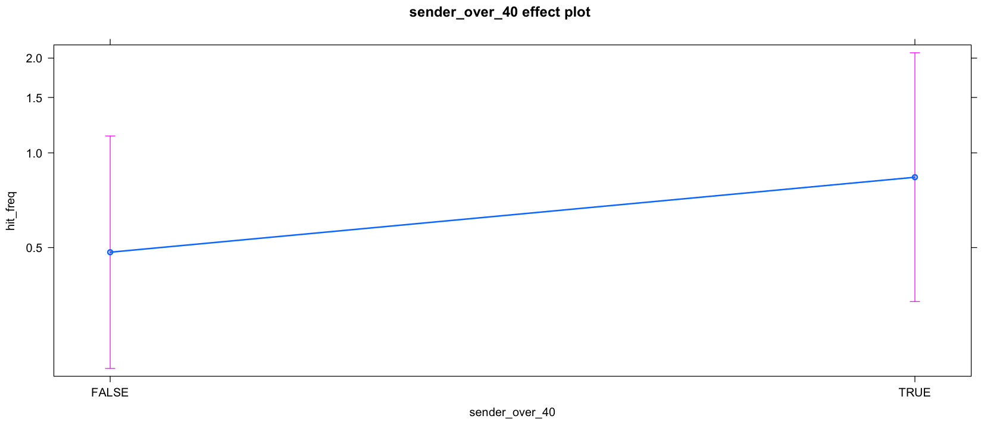

In [41]:
j_glmer5f <- glmer(hit_freq ~ connection + sender_over_40 + (1|pair),
                  data=jnf_se40,
                  family=negative.binomial(theta = 1),
                  nAGQ=0L)
summary(j_glmer5f)

"------------------------------dispersion------------------------------"
dispersion_glmer(j_glmer5f)

"------------------------------drop1------------------------------"
drop1(j_glmer5f, test = "Chisq")

effect("connection", j_glmer5f)
effect("sender_over_40", j_glmer5f)

plot(effect("connection", j_glmer5f))
plot(effect("sender_over_40", j_glmer5f))

par(cex.axis = 0.8)

options(repr.plot.width = 14, repr.plot.height = 6)

"sender_over_40" remains a significant predictor. It is highly significant when "pairs" are used instead of "sender". This model is the best fit. It has negative correlations, meaning that senders who are older than 40 are less inclined to appeal to God.

### 7.1 Generalised linear mixed-effects model using "connection" and "addressee_over_40" as fixed effects, and "sender" as random effect, negative binomial

In [34]:
# remove "UNK" and "MULT" values from sender_over_40 column
j_conn_ad40 <- jeake_conn[!(jeake_conn$addressee_over_40 %in% c("MULT", "UNK")),  ]
j_conn_ad40$addressee_over_40 <- droplevels(j_conn_ad40$addressee_over_40)

levels(j_conn_ad40$addressee_over_40)
nrow(j_conn_ad40)

[1] "FALSE" "TRUE"

[1] 259

Generalized linear mixed model fit by maximum likelihood (Adaptive
  Gauss-Hermite Quadrature, nAGQ = 0) [glmerMod]
 Family: Negative Binomial(1)  ( log )
Formula: hit_freq ~ connection + addressee_over_40 + (1 | sender)
   Data: j_conn_ad40

     AIC      BIC   logLik deviance df.resid 
   724.7    753.2   -354.4    708.7      251 

Scaled residuals: 
    Min      1Q  Median      3Q     Max 
-0.9332 -0.6674 -0.5623 -0.3706  9.6899 

Random effects:
 Groups Name        Variance Std.Dev.
 sender (Intercept) 2.578    1.606   
Number of obs: 259, groups:  sender, 32

Fixed effects:
                           Estimate Std. Error z value Pr(>|z|)   
(Intercept)                 -0.8794     0.7444  -1.181  0.23750   
connectionBUSINESS; FRIEND   0.8126     1.5012   0.541  0.58831   
connectionEXTENDED FAMILY    0.2717     1.0083   0.270  0.78754   
connectionFAMILY             0.1782     0.9485   0.188  0.85098   
connectionFRIEND             4.4572     1.5432   2.888  0.00387 **
addressee_ov

[1] "------------------------------dispersion------------------------------"

[1] 1.212901

[1] "------------------------------drop1------------------------------"

,Df,AIC,LRT,Pr(Chi)
<none>,NA,724.7473,NA,NA
connection,4,725.3202,8.5728473,0.07270961
addressee_over_40,1,723.1198,0.3724401,0.54167721



 connection effect
connection
BUSINESS; CORRESPONDENT        BUSINESS; FRIEND         EXTENDED FAMILY 
              0.3991682               0.8996074               0.5238072 
                 FAMILY                  FRIEND 
              0.4770231              34.4278529 


 addressee_over_40 effect
addressee_over_40
    FALSE      TRUE 
0.5512358 0.4281918 

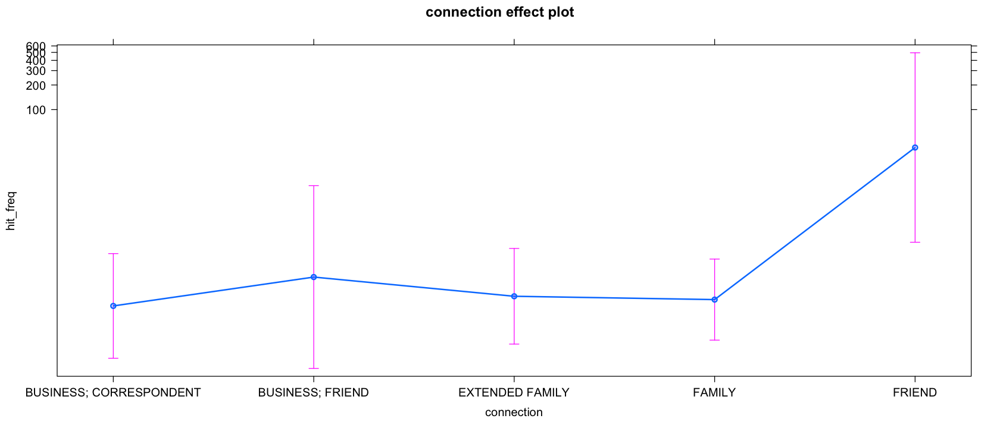

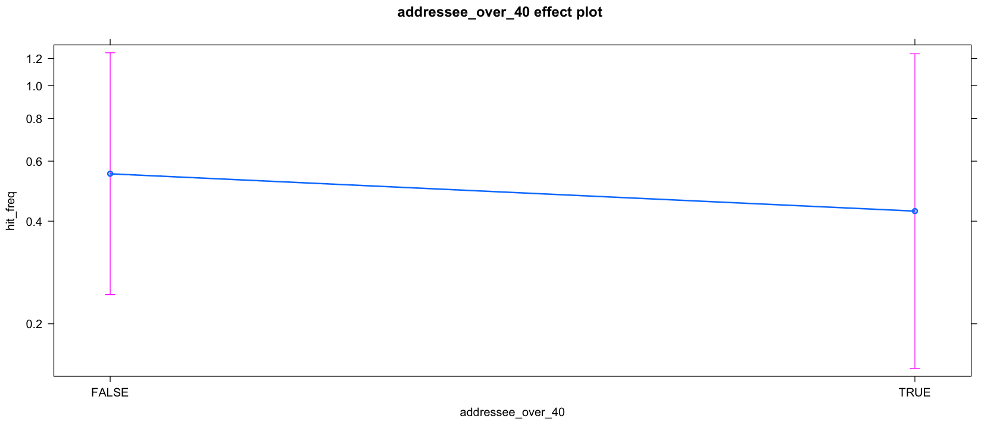

In [35]:
j_glmer6 <- glmer(hit_freq ~ connection + addressee_over_40 + (1|sender),
                  data=j_conn_ad40,
                  family=negative.binomial(theta = 1),
                  nAGQ=0L)
summary(j_glmer6)

"------------------------------dispersion------------------------------"
dispersion_glmer(j_glmer6)

"------------------------------drop1------------------------------"
drop1(j_glmer6, test = "Chisq")

effect("connection", j_glmer6)
effect("addressee_over_40", j_glmer6)

plot(effect("connection", j_glmer6))
plot(effect("addressee_over_40", j_glmer6))

par(cex.axis = 0.8)

options(repr.plot.width = 14, repr.plot.height = 6)

'addressee_over_40' shows no significance and has weak to no correlation with the other predictors. The presence of this variable would not help improve the model, as shown by the higher AIC coupled with the high p-value in the drop1 result.

### 7.2 Generalised linear mixed-effects model using "connection" and "addressee_over_40" as fixed effects, and "pair" as random effect, negative binomial

Generalized linear mixed model fit by maximum likelihood (Adaptive
  Gauss-Hermite Quadrature, nAGQ = 0) [glmerMod]
 Family: Negative Binomial(1)  ( log )
Formula: hit_freq ~ connection + addressee_over_40 + (1 | pair)
   Data: j_conn_ad40

     AIC      BIC   logLik deviance df.resid 
   708.0    736.4   -346.0    692.0      251 

Scaled residuals: 
    Min      1Q  Median      3Q     Max 
-0.9322 -0.6358 -0.4728 -0.3695  9.7332 

Random effects:
 Groups Name        Variance Std.Dev.
 pair   (Intercept) 2.434    1.56    
Number of obs: 259, groups:  pair, 47

Fixed effects:
                           Estimate Std. Error z value Pr(>|z|)   
(Intercept)                -0.84688    0.72805  -1.163   0.2447   
connectionBUSINESS; FRIEND  0.80332    1.46338   0.549   0.5830   
connectionEXTENDED FAMILY   0.12203    0.96430   0.127   0.8993   
connectionFAMILY            0.04242    0.87390   0.049   0.9613   
connectionFRIEND            4.45472    1.51094   2.948   0.0032 **
addressee_over_4

[1] "------------------------------dispersion------------------------------"

[1] 1.17022

[1] "------------------------------drop1------------------------------"

,Df,AIC,LRT,Pr(Chi)
<none>,NA,707.9592,NA,NA
connection,4,709.6754,9.71618402,0.04548976
addressee_over_40,1,705.9849,0.02566519,0.87272069



 connection effect
connection
BUSINESS; CORRESPONDENT        BUSINESS; FRIEND         EXTENDED FAMILY 
              0.4147840               0.9261878               0.4686203 
                 FAMILY                  FRIEND 
              0.4327567              35.6846703 


 addressee_over_40 effect
addressee_over_40
    FALSE      TRUE 
0.5067567 0.4089631 

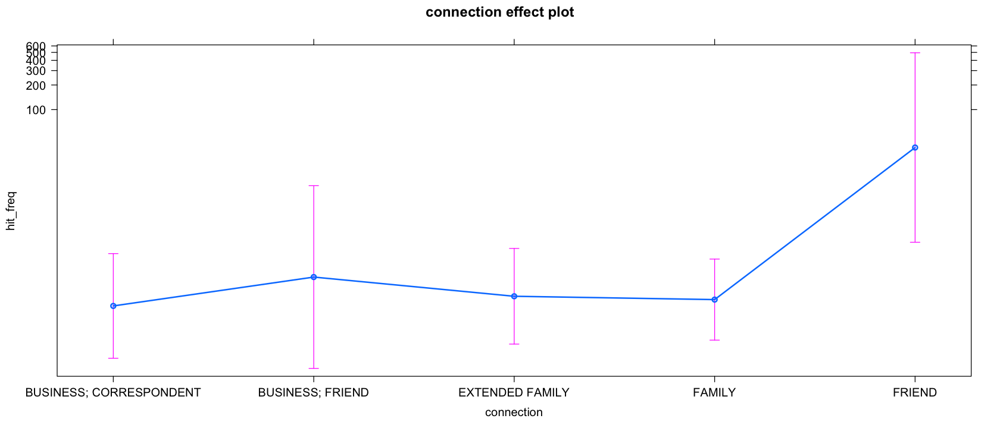

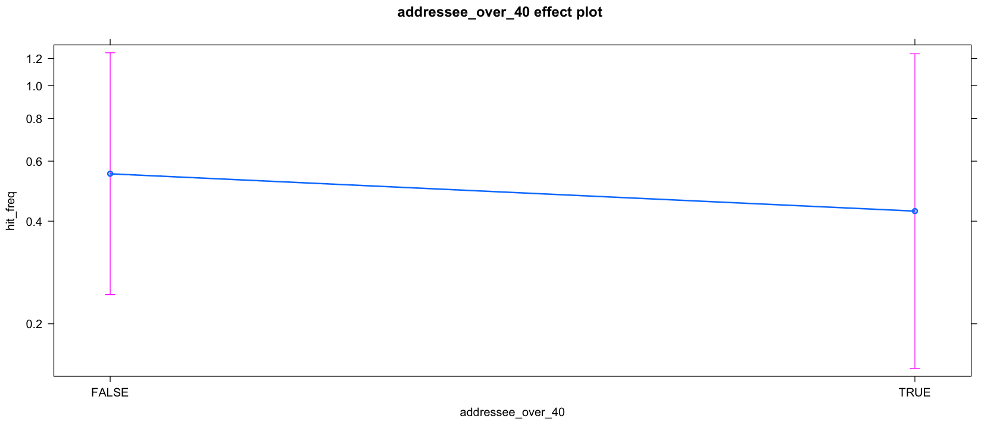

In [36]:
j_glmer6b <- glmer(hit_freq ~ connection + addressee_over_40 + (1|pair),
                  data=j_conn_ad40,
                  family=negative.binomial(theta = 1),
                  nAGQ=0L)
summary(j_glmer6b)

"------------------------------dispersion------------------------------"
dispersion_glmer(j_glmer6b)

"------------------------------drop1------------------------------"
drop1(j_glmer6b, test = "Chisq")

effect("connection", j_glmer6b)
effect("addressee_over_40", j_glmer6b)

plot(effect("connection", j_glmer6))
plot(effect("addressee_over_40", j_glmer6))

par(cex.axis = 0.8)

options(repr.plot.width = 14, repr.plot.height = 6)

When using "pair" as a mixed effect, the addressee being over 40 years old become a significant predictor. The correlations to the connection types are negative and weak (but still higher than if "sender" was used as a mixed effect). The model is a slightly worse fit.

The trend is similar to the results of the model with "sender" but without "decennium" as mixed effects. ('addressee_over_40' shows no significance and has weak to no correlation with the other predictors. The presence of this variable would not help improve the model, as shown by the higher AIC coupled with the high p-value in the drop1 result). However, this model proves to be the best fit.

### 8.1 Generalised linear mixed-effects model using "connection" and "gender_pair" as fixed effects, and "sender" as random effects, negative binomial, without "FRIEND" variable

Generalized linear mixed model fit by maximum likelihood (Adaptive
  Gauss-Hermite Quadrature, nAGQ = 0) [glmerMod]
 Family: Negative Binomial(1)  ( log )
Formula: 
hit_freq ~ connection + gender_pair + (1 | sender) + (1 | quinquennial)
   Data: jnf_gender

     AIC      BIC   logLik deviance df.resid 
   712.7    748.5   -346.3    692.7      256 

Scaled residuals: 
    Min      1Q  Median      3Q     Max 
-0.9726 -0.6096 -0.5253 -0.2866  9.8113 

Random effects:
 Groups       Name        Variance Std.Dev.
 sender       (Intercept) 3.8738   1.9682  
 quinquennial (Intercept) 0.5512   0.7425  
Number of obs: 266, groups:  sender, 31; quinquennial, 13

Fixed effects:
                           Estimate Std. Error z value Pr(>|z|)  
(Intercept)                  0.3591     1.1654   0.308   0.7579  
connectionBUSINESS; FRIEND   0.1409     1.7240   0.082   0.9349  
connectionEXTENDED FAMILY   -0.6513     1.1007  -0.592   0.5541  
connectionFAMILY            -0.6709     0.6352  -1.056   0.29

[1] "------------------------------dispersion------------------------------"

[1] 1.144741

[1] "------------------------------drop1------------------------------"

,Df,AIC,LRT,Pr(Chi)
<none>,NA,712.6622,NA,NA
connection,3,707.5654,0.9032371,0.8246466
gender_pair,3,711.2776,4.6154626,0.2022196



 connection effect
connection
BUSINESS; CORRESPONDENT        BUSINESS; FRIEND         EXTENDED FAMILY 
              0.4753010               0.5472192               0.2478180 
                 FAMILY 
              0.2430012 


 gender_pair effect
gender_pair
FEMALE-FEMALE   FEMALE-MALE   MALE-FEMALE     MALE-MALE 
    0.8433854     0.2553863     0.1560701     0.2723310 

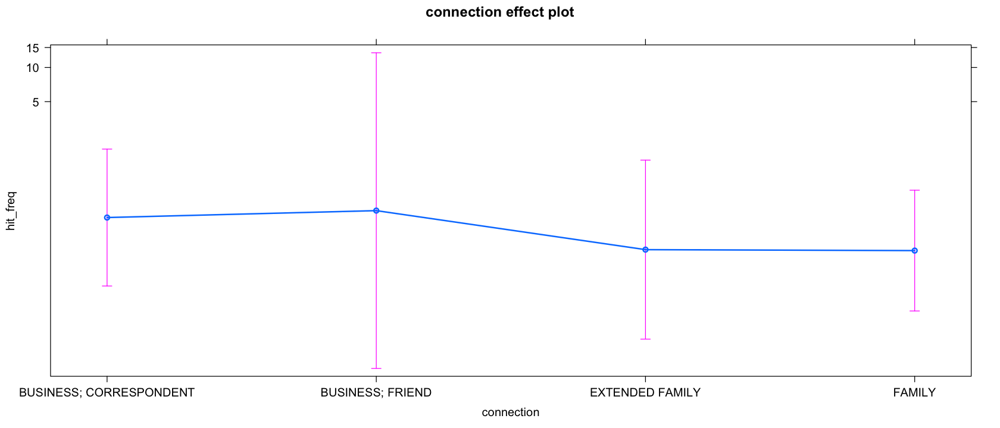

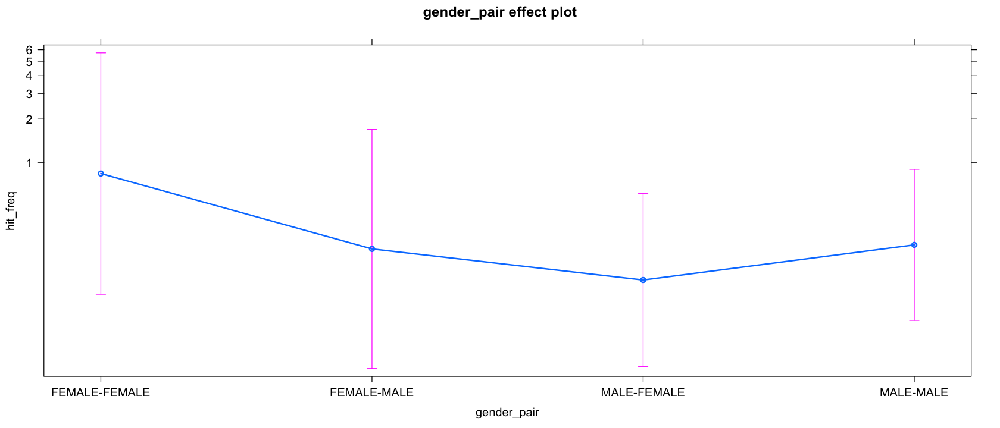

In [69]:
j_glmer7a <- glmer(hit_freq ~ connection + gender_pair + (1|sender),
                  data=jnf_gender,
                  family=negative.binomial(theta = 1),
                  nAGQ=0L)
summary(j_glmer7a)

"------------------------------dispersion------------------------------"
dispersion_glmer(j_glmer7a)

"------------------------------drop1------------------------------"
drop1(j_glmer7a, test = "Chisq")

effect("connection", j_glmer7a)
effect("gender_pair", j_glmer7a)

plot(effect("connection", j_glmer7a))
plot(effect("gender_pair", j_glmer7a))

### 8.2 Generalised linear mixed-effects model using "connection" and "gender_pair" as fixed effects, and "pair" as random effects, negative binomial, without "FRIEND" variable

Generalized linear mixed model fit by maximum likelihood (Adaptive
  Gauss-Hermite Quadrature, nAGQ = 0) [glmerMod]
 Family: Negative Binomial(1)  ( log )
Formula: hit_freq ~ connection + gender_pair + (1 | pair)
   Data: jnf_gender

     AIC      BIC   logLik deviance df.resid 
   717.6    749.8   -349.8    699.6      257 

Scaled residuals: 
    Min      1Q  Median      3Q     Max 
-0.9338 -0.6463 -0.4690 -0.3350  9.7535 

Random effects:
 Groups Name        Variance Std.Dev.
 pair   (Intercept) 3.256    1.804   
Number of obs: 266, groups:  pair, 53

Fixed effects:
                           Estimate Std. Error z value Pr(>|z|)
(Intercept)                -1.30824    1.22739  -1.066    0.286
connectionBUSINESS; FRIEND  0.81083    1.59690   0.508    0.612
connectionEXTENDED FAMILY   0.31520    1.06145   0.297    0.767
connectionFAMILY            0.55478    0.93152   0.596    0.551
gender_pairFEMALE-MALE     -0.06808    1.19664  -0.057    0.955
gender_pairMALE-FEMALE     -0.46268    1.

[1] "------------------------------dispersion------------------------------"

[1] 1.154731

[1] "------------------------------drop1------------------------------"

,Df,AIC,LRT,Pr(Chi)
<none>,NA,717.5665,NA,NA
connection,3,712.6489,1.082406,0.7813228
gender_pair,3,712.6349,1.068451,0.7846950



 connection effect
connection
BUSINESS; CORRESPONDENT        BUSINESS; FRIEND         EXTENDED FAMILY 
              0.2996551               0.6741533               0.4106869 
                 FAMILY 
              0.5218681 


 gender_pair effect
gender_pair
FEMALE-FEMALE   FEMALE-MALE   MALE-FEMALE     MALE-MALE 
    0.4378248     0.4090112     0.2756522     0.6125681 

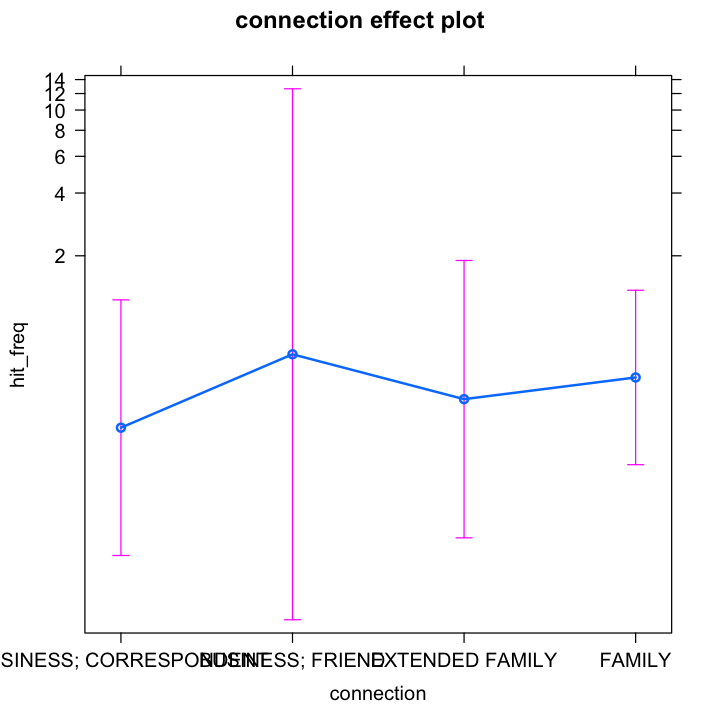

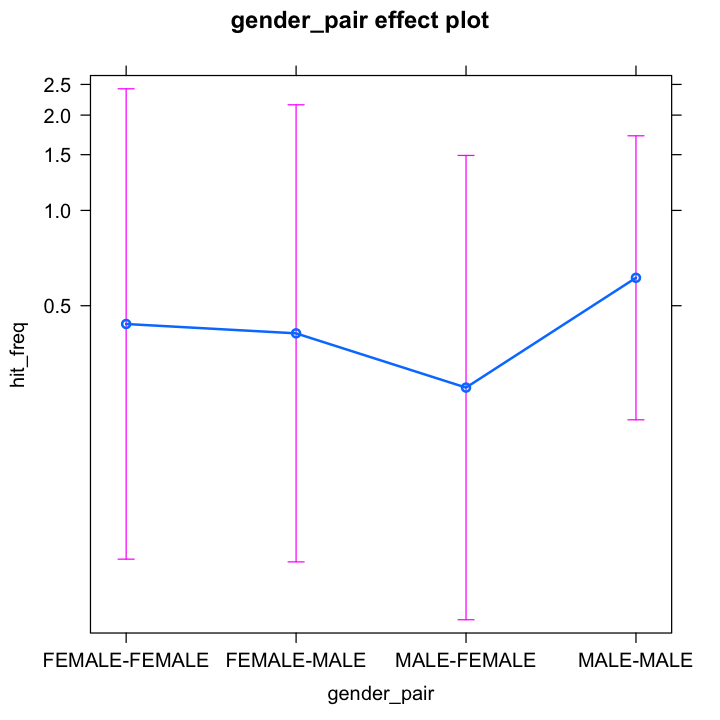

In [46]:
j_glmer7b <- glmer(hit_freq ~ connection + gender_pair + (1|pair),
                  data=jnf_gender,
                  family=negative.binomial(theta = 1),
                  nAGQ=0L)
summary(j_glmer7b)

"------------------------------dispersion------------------------------"
dispersion_glmer(j_glmer7b)

"------------------------------drop1------------------------------"
drop1(j_glmer7b, test = "Chisq")

effect("connection", j_glmer7b)
effect("gender_pair", j_glmer7b)

plot(effect("connection", j_glmer7b))
plot(effect("gender_pair", j_glmer7b))

### 8.3 Generalised linear model using "connection" and "gender_pair" as predictors, quasipoisson, without "FRIEND" variable

In [47]:
j_glmer7f <- glm(hit_freq ~ connection + gender_pair,
                  data=jnf_genderadd,
                  family=quasipoisson)
summary(j_glmer7f)

"------------------------------dispersion------------------------------"
#dispersion_glmer(j_glmer7f)

"------------------------------drop1------------------------------"
drop1(j_glmer7f, test = "Chisq")

effect("connection", j_glmer7f)
effect("gender_sender", j_glmer7f)

plot(effect("connection", j_glmer7f))
plot(effect("gender_sender", j_glmer7f))


Call:
glm(formula = hit_freq ~ connection + gender_pair, family = quasipoisson, 
    data = jnf_genderadd)

Deviance Residuals: 
   Min      1Q  Median      3Q     Max  
-2.382  -1.558  -1.350  -0.936   8.821  

Coefficients:
                           Estimate Std. Error t value Pr(>|t|)  
(Intercept)                 0.80100    0.74390   1.077   0.2826  
connectionBUSINESS; FRIEND  0.23125    0.54201   0.427   0.6700  
connectionEXTENDED FAMILY  -0.61731    0.56273  -1.097   0.2737  
connectionFAMILY           -0.90433    0.52878  -1.710   0.0884 .
gender_pairFEMALE-MALE      0.69736    0.70823   0.985   0.3257  
gender_pairMALE-FEMALE     -0.72204    0.80923  -0.892   0.3731  
gender_pairMALE-MALE        0.01047    0.62095   0.017   0.9866  
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

(Dispersion parameter for quasipoisson family taken to be 8.6694)

    Null deviance: 1357.3  on 265  degrees of freedom
Residual deviance: 1246.8  on 259  degrees of freedom
AI

[1] "------------------------------dispersion------------------------------"

[1] "------------------------------drop1------------------------------"

,Df,Deviance,scaled dev.,Pr(>Chi)
<none>,NA,1246.760,NA,NA
connection,3,1301.739,6.341715,0.09611831
gender_pair,3,1278.781,3.693522,0.29651658



 connection effect
connection
BUSINESS; CORRESPONDENT        BUSINESS; FRIEND         EXTENDED FAMILY 
              2.0839994               2.6261942               1.1240991 
                 FAMILY 
              0.8436266 

NOTE: gender_sender does not appear in the model


ERROR: Error in Analyze.model(focal.predictors, mod, xlevels, default.levels, : the following predictor is not in the model: gender_sender


When paired, gender is not a significant predictor. What if we looked at the sender and addressee's gender apart?

In [20]:
# remove multigender values from gender_addressee column

jnf_genderadd <- jeake_nofriend[!(jeake_nofriend$gender_addressee %in% "MULT"),  ]
jnf_genderadd$gender_addressee <- droplevels(jnf_genderadd$gender_addressee)

levels(jnf_genderadd$gender_addressee)
nrow(jnf_genderadd)

str(jnf_genderadd)

[1] "FEMALE" "MALE"

[1] 266

'data.frame':	266 obs. of  35 variables:
 $ id                  : Factor w/ 272 levels "1","3","11","12",..: 3 4 5 6 8 9 10 11 12 13 ...
 $ hit_freq            : num  0 1.69 0 0 15.17 ...
 $ conf_freq           : num  0 0 0 0 0 0 0 0 0 0 ...
 $ approve_freq        : num  0 0 0 0 0 0 0 0 0 1.73 ...
 $ fixed_freq          : num  0 0 0 0 0 0 0 0 0 0 ...
 $ object_freq         : num  0 0 0 0 1.73 0 0 0 0 0 ...
 $ grat_freq           : num  0 0 0 0 1.73 0 0 0 0 0 ...
 $ pray_freq           : num  0 1.73 0 0 0 0 0 0 0 0 ...
 $ preserve_freq       : num  0 1.73 0 0 0 0 0 0 0 0 ...
 $ presupp_freq        : num  0 0 0 0 5.19 0 0 0 0 0 ...
 $ resign_freq         : num  0 0 0 0 5.19 0 0 0 0 0 ...
 $ travel_freq         : num  0 0 0 0 0 0 0 0 0 0 ...
 $ trade_freq          : num  0 0 0 0 0 0 0 0 0 0 ...
 $ health_freq         : num  0 0 0 0 5.19 0 0 0 0 0 ...
 $ politics_freq       : num  0 0 0 0 0 0 0 0 0 0 ...
 $ social_freq         : num  0 0 0 0 0 0 0 0 0 1.73 ...
 $ connection          : Fact

### 8.4 Generalised linear model using "connection" and "gender_sender" as predictors, quasipoisson, without "FRIEND" variable


Call:
glm(formula = hit_freq ~ connection + gender_sender, family = quasipoisson, 
    data = jeake_nofriend)

Deviance Residuals: 
   Min      1Q  Median      3Q     Max  
-2.337  -1.645  -1.199  -1.199   8.834  

Coefficients:
                           Estimate Std. Error t value Pr(>|t|)  
(Intercept)                  1.3973     0.5821   2.401   0.0171 *
connectionBUSINESS; FRIEND   0.2397     0.5461   0.439   0.6610  
connectionEXTENDED FAMILY   -0.5771     0.5596  -1.031   0.3034  
connectionFAMILY            -1.0953     0.5161  -2.122   0.0347 *
gender_senderMALE           -0.6321     0.4003  -1.579   0.1156  
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

(Dispersion parameter for quasipoisson family taken to be 8.82648)

    Null deviance: 1383.8  on 267  degrees of freedom
Residual deviance: 1294.8  on 263  degrees of freedom
AIC: NA

Number of Fisher Scoring iterations: 7


[1] "------------------------------dispersion------------------------------"

[1] "------------------------------drop1------------------------------"

,Df,Deviance,scaled dev.,Pr(>Chi)
<none>,NA,1294.761,NA,NA
connection,3,1379.553,9.606496,0.02222499
gender_sender,1,1315.648,2.366360,0.12397586



 connection effect
connection
BUSINESS; CORRESPONDENT        BUSINESS; FRIEND         EXTENDED FAMILY 
              2.4704863               3.1397059               1.3872922 
                 FAMILY 
              0.8262065 


 gender_sender effect
gender_sender
  FEMALE     MALE 
1.890556 1.004814 

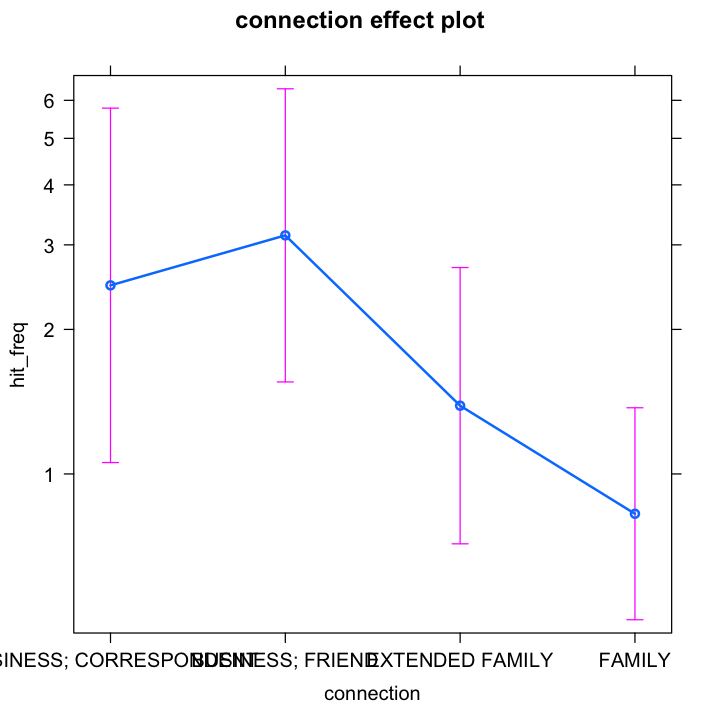

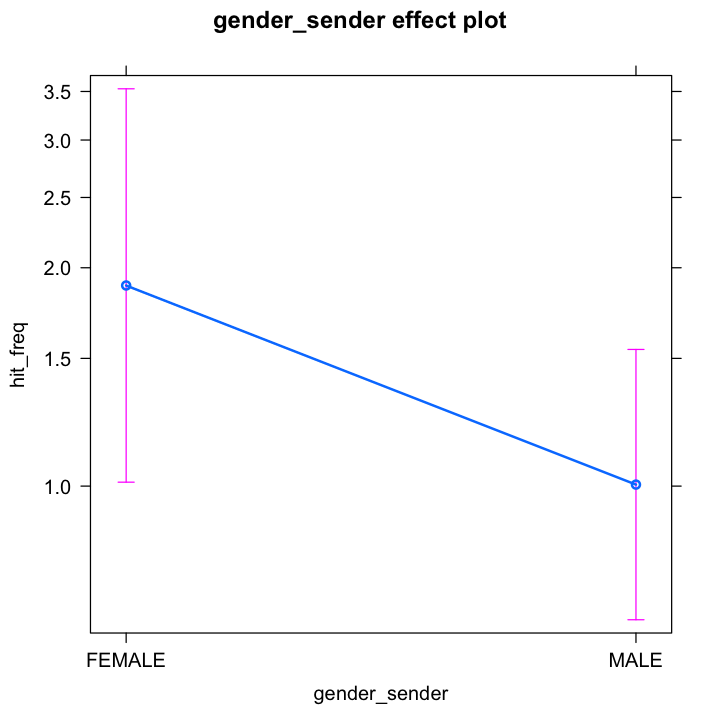

In [49]:
j_glmer7f <- glm(hit_freq ~ connection + gender_sender,
                  data=jeake_nofriend,
                  family=quasipoisson)
summary(j_glmer7f)

"------------------------------dispersion------------------------------"
#dispersion_glmer(j_glmer7f)

"------------------------------drop1------------------------------"
drop1(j_glmer7f, test = "Chisq")

effect("connection", j_glmer7f)
effect("gender_sender", j_glmer7f)

plot(effect("connection", j_glmer7f))
plot(effect("gender_sender", j_glmer7f))

### 8.4 Generalised linear model using "connection" and "gender_addressee" as predictors, quasipoisson, without "FRIEND" variable


Call:
glm(formula = hit_freq ~ connection + gender_addressee, family = quasipoisson, 
    data = jeake_nofriend)

Deviance Residuals: 
   Min      1Q  Median      3Q     Max  
-3.750  -1.745  -1.499  -1.116   8.315  

Coefficients:
                           Estimate Std. Error t value Pr(>|t|)
(Intercept)                  0.2145     0.6366   0.337    0.736
connectionBUSINESS; FRIEND   0.1377     0.5605   0.246    0.806
connectionEXTENDED FAMILY   -0.3848     0.5408  -0.712    0.477
connectionFAMILY            -0.6880     0.5166  -1.332    0.184
gender_addresseeMALE         0.5903     0.4967   1.188    0.236
gender_addresseeMULT         1.5981     1.0758   1.485    0.139

(Dispersion parameter for quasipoisson family taken to be 9.02953)

    Null deviance: 1383.8  on 267  degrees of freedom
Residual deviance: 1293.9  on 262  degrees of freedom
AIC: NA

Number of Fisher Scoring iterations: 7


[1] "------------------------------dispersion------------------------------"

[1] "------------------------------drop1------------------------------"

,Df,Deviance,scaled dev.,Pr(>Chi)
<none>,NA,1293.913,NA,NA
connection,3,1327.171,3.683302,0.2977550
gender_addressee,2,1315.648,2.407124,0.3001233



 connection effect
connection
BUSINESS; CORRESPONDENT        BUSINESS; FRIEND         EXTENDED FAMILY 
              1.8725685               2.1490965               1.2744264 
                 FAMILY 
              0.9410816 


 gender_addressee effect
gender_addressee
   FEMALE      MALE      MULT 
0.7641071 1.3788342 3.7774178 

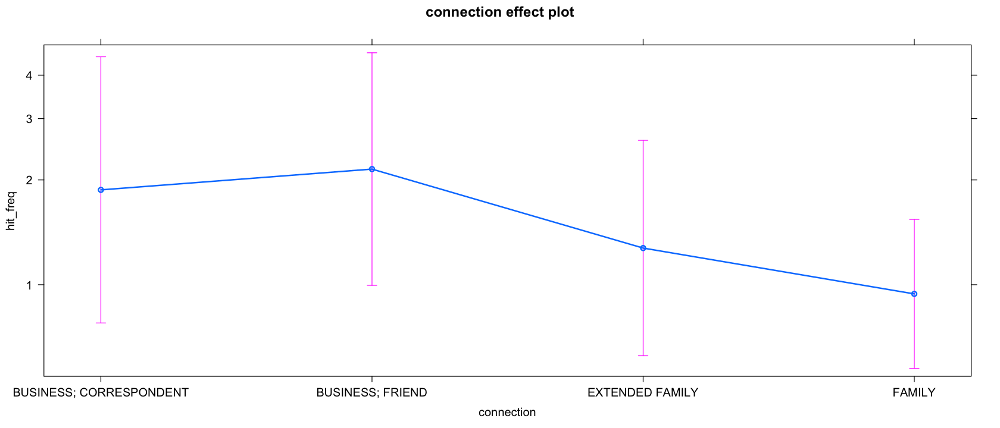

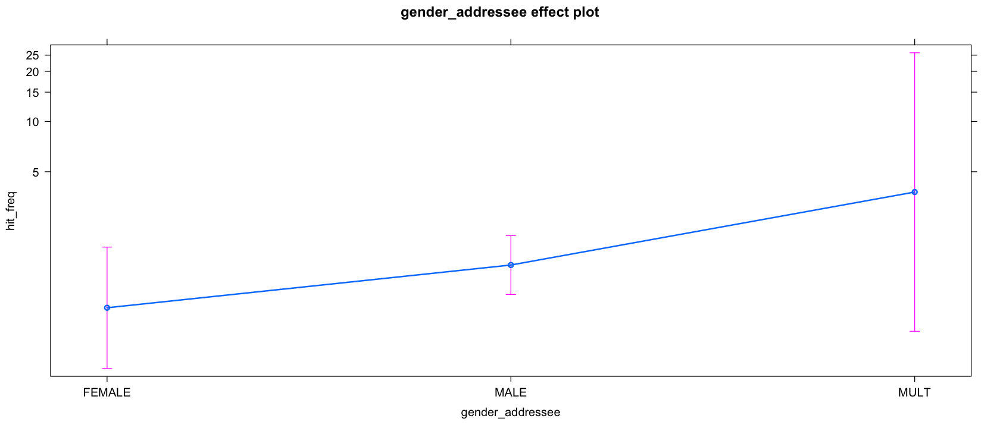

In [30]:
j_glmer7f <- glm(hit_freq ~ connection + gender_addressee,
                  data=jeake_nofriend,
                  family=quasipoisson)
summary(j_glmer7f)

"------------------------------dispersion------------------------------"
#dispersion_glmer(j_glmer7f)

"------------------------------drop1------------------------------"
drop1(j_glmer7f, test = "Chisq")

effect("connection", j_glmer7f)
effect("gender_addressee", j_glmer7f)

plot(effect("connection", j_glmer7f))
plot(effect("gender_addressee", j_glmer7f))

### 8.5 Generalised linear mixed-effects model using "connection" and "gender_sender" as predictors, and "sender" as a random effect, negative binomial, without "FRIEND" variable

Generalized linear mixed model fit by maximum likelihood (Adaptive
  Gauss-Hermite Quadrature, nAGQ = 0) [glmerMod]
 Family: Negative Binomial(1)  ( log )
Formula: hit_freq ~ connection + gender_sender + (1 | sender)
   Data: jeake_nofriend

     AIC      BIC   logLik deviance df.resid 
   755.8    780.9   -370.9    741.8      261 

Scaled residuals: 
    Min      1Q  Median      3Q     Max 
-0.9355 -0.7452 -0.5864 -0.3908  9.8414 

Random effects:
 Groups Name        Variance Std.Dev.
 sender (Intercept) 3.082    1.756   
Number of obs: 268, groups:  sender, 31

Fixed effects:
                            Estimate Std. Error z value Pr(>|z|)  
(Intercept)                 0.391350   0.937850   0.417   0.6765  
connectionBUSINESS; FRIEND -0.005982   1.525125  -0.004   0.9969  
connectionEXTENDED FAMILY  -0.747418   0.948768  -0.788   0.4308  
connectionFAMILY           -1.259606   0.512232  -2.459   0.0139 *
gender_senderMALE          -0.551324   0.910158  -0.606   0.5447  
---
Signif. c

[1] "------------------------------dispersion------------------------------"

[1] 1.229813

[1] "------------------------------drop1------------------------------"

,Df,AIC,LRT,Pr(Chi)
<none>,NA,755.7524,NA,NA
connection,3,756.6544,6.9020301,0.07508683
gender_sender,1,754.0810,0.3286217,0.56647180



 connection effect
connection
BUSINESS; CORRESPONDENT        BUSINESS; FRIEND         EXTENDED FAMILY 
              0.9621358               0.9563971               0.4556558 
                 FAMILY 
              0.2730213 


 gender_sender effect
gender_sender
   FEMALE      MALE 
0.5893448 0.3395726 

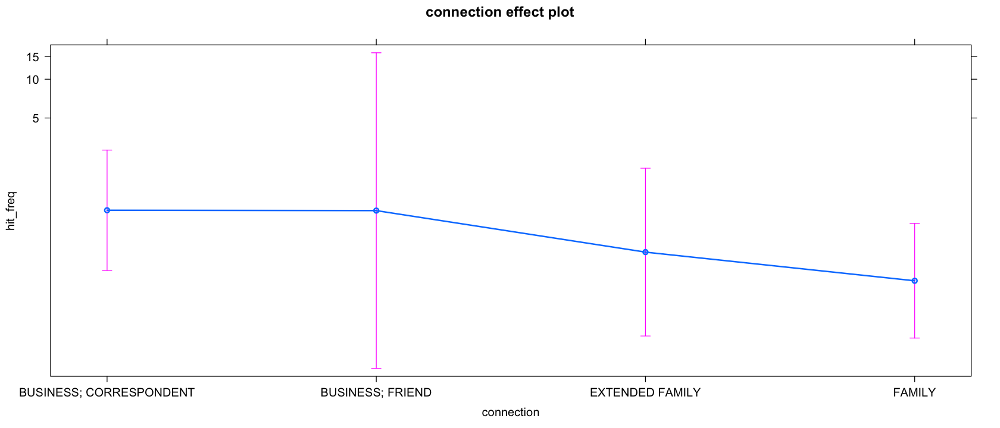

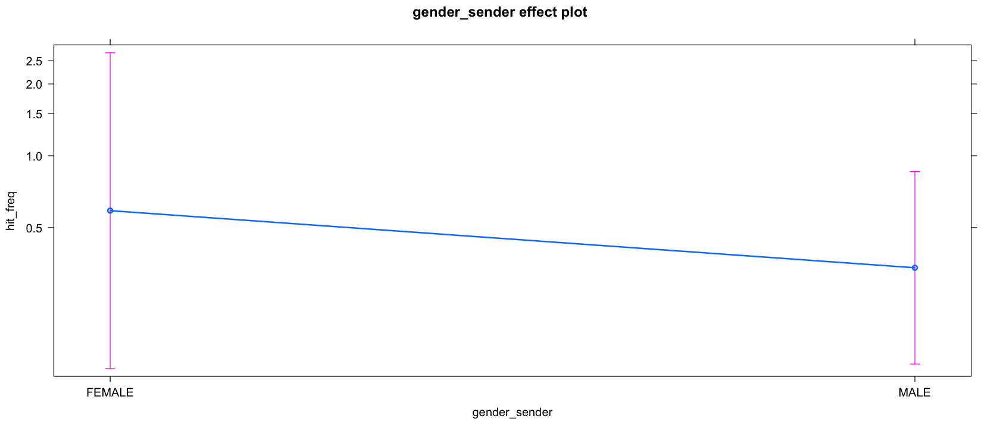

In [34]:
j_glmer7h <- glmer(hit_freq ~ connection + gender_sender + (1|sender),
                  data=jeake_nofriend,
                  family=negative.binomial(theta = 1),
                  nAGQ=0L)
summary(j_glmer7h)

"------------------------------dispersion------------------------------"
dispersion_glmer(j_glmer7h)

"------------------------------drop1------------------------------"
drop1(j_glmer7h, test = "Chisq")

effect("connection", j_glmer7h)
effect("gender_sender", j_glmer7h)

plot(effect("connection", j_glmer7h))
plot(effect("gender_sender", j_glmer7h))

### 8.6 Generalised linear mixed-effects model using "connection" and "gender_addressee" as predictors, and "sender" as a random effect, negative binomial, without "FRIEND" variable

Generalized linear mixed model fit by maximum likelihood (Adaptive
  Gauss-Hermite Quadrature, nAGQ = 0) [glmerMod]
 Family: Negative Binomial(1)  ( log )
Formula: hit_freq ~ connection + gender_addressee + (1 | sender)
   Data: jnf_genderadd

     AIC      BIC   logLik deviance df.resid 
   744.9    770.0   -365.5    730.9      259 

Scaled residuals: 
    Min      1Q  Median      3Q     Max 
-0.9343 -0.6986 -0.5749 -0.3762  9.7303 

Random effects:
 Groups Name        Variance Std.Dev.
 sender (Intercept) 2.954    1.719   
Number of obs: 266, groups:  sender, 31

Fixed effects:
                           Estimate Std. Error z value Pr(>|z|)  
(Intercept)                -0.36509    0.64490  -0.566   0.5713  
connectionBUSINESS; FRIEND -0.03745    1.48873  -0.025   0.9799  
connectionEXTENDED FAMILY  -0.55512    0.90049  -0.616   0.5376  
connectionFAMILY           -1.01976    0.54259  -1.879   0.0602 .
gender_addresseeMALE        0.28056    0.33211   0.845   0.3982  
---
Signif. codes

[1] "------------------------------dispersion------------------------------"

[1] 1.229941

[1] "------------------------------drop1------------------------------"

,Df,AIC,LRT,Pr(Chi)
<none>,NA,744.9141,NA,NA
connection,3,742.3769,3.4628114,0.3256175
gender_addressee,1,743.5899,0.6758726,0.4110116



 connection effect
connection
BUSINESS; CORRESPONDENT        BUSINESS; FRIEND         EXTENDED FAMILY 
              0.8410282               0.8101172               0.4827528 
                 FAMILY 
              0.3033443 


 gender_addressee effect
gender_addressee
   FEMALE      MALE 
0.3313477 0.4386611 

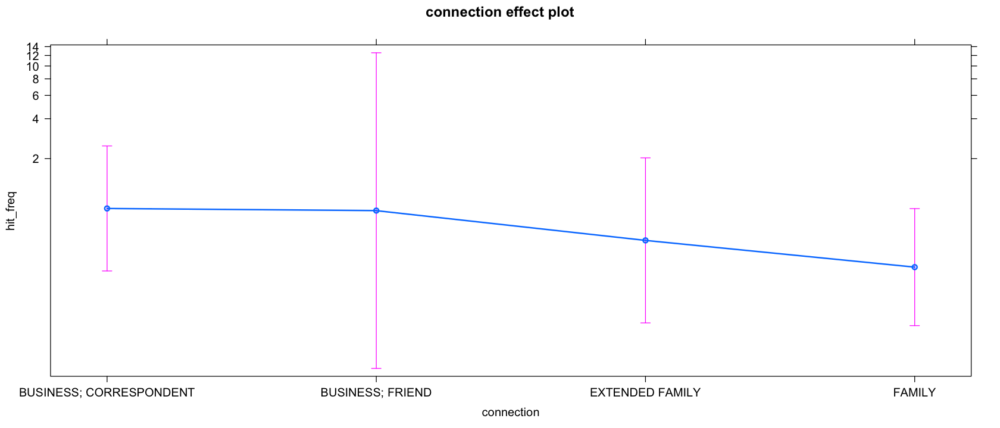

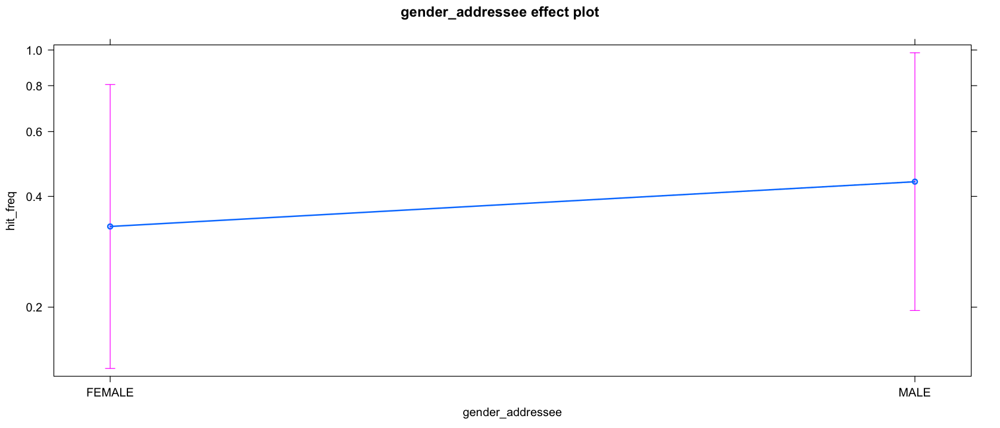

In [36]:
j_glmer7i <- glmer(hit_freq ~ connection + gender_addressee + (1|sender),
                  data=jnf_genderadd,
                  family=negative.binomial(theta = 1),
                  nAGQ=0L)
summary(j_glmer7i)

"------------------------------dispersion------------------------------"
dispersion_glmer(j_glmer7i)

"------------------------------drop1------------------------------"
drop1(j_glmer7i, test = "Chisq")

effect("connection", j_glmer7i)
effect("gender_addressee", j_glmer7i)

plot(effect("connection", j_glmer7i))
plot(effect("gender_addressee", j_glmer7i))

Separated from their pairings, the gender variables do not become significant either.

### 9.1 Generalised linear mixed-effects model using previously significant predictors as fixed effects, and "sender" as random effect, negative binomial

In [73]:
# remove "UNK" and "MULT" values from significant predictor columns

"Regular dataset:"
j_conn_sig <- subset(jeake_conn, !(age_gap_over_20 %in% c("MULT", "UNK") | 
                                   sender_over_40 %in% c("MULT", "UNK")))

j_conn_sig$age_gap_over_20 <- droplevels(j_conn_sig$age_gap_over_20)
j_conn_sig$sender_over_40 <- droplevels(j_conn_sig$sender_over_40)

levels(j_conn_sig$age_gap_over_20)
levels(j_conn_sig$sender_over_40)

nrow(j_conn_sig)

'"FRIEND" variable removed:'
jnf_sig <- subset(jeake_nofriend, !(age_gap_over_20 %in% c("MULT", "UNK") | 
                                   sender_over_40 %in% c("MULT", "UNK")))

jnf_sig$age_gap_over_20 <- droplevels(jnf_sig$age_gap_over_20)
jnf_sig$sender_over_40 <- droplevels(jnf_sig$sender_over_40)

levels(jnf_sig$age_gap_over_20)
levels(jnf_sig$sender_over_40)

nrow(jnf_sig)

[1] "Regular dataset:"

[1] "FALSE" "TRUE"

[1] "FALSE" "TRUE"

[1] 186

[1] "\"FRIEND\" variable removed:"

[1] "FALSE" "TRUE"

[1] "FALSE" "TRUE"

[1] 186

Generalized linear mixed model fit by maximum likelihood (Adaptive
  Gauss-Hermite Quadrature, nAGQ = 0) [glmerMod]
 Family: Negative Binomial(1)  ( log )
Formula: hit_freq ~ connection + age_gap_over_20 + sender_over_40 + (1 |  
    sender)
   Data: j_conn_sig

     AIC      BIC   logLik deviance df.resid 
   516.4    539.0   -251.2    502.4      179 

Scaled residuals: 
    Min      1Q  Median      3Q     Max 
-0.9355 -0.7436 -0.5805 -0.1208  6.3509 

Random effects:
 Groups Name        Variance Std.Dev.
 sender (Intercept) 0        0       
Number of obs: 186, groups:  sender, 12

Fixed effects:
                          Estimate Std. Error z value Pr(>|z|)    
(Intercept)                0.24444    0.35251   0.693  0.48804    
connectionEXTENDED FAMILY -0.04303    0.55655  -0.077  0.93837    
connectionFAMILY          -1.77855    0.35340  -5.033 4.84e-07 ***
age_gap_over_20TRUE        0.85747    0.29503   2.906  0.00366 ** 
sender_over_40TRUE         0.88916    0.27033   3.289  0.00

[1] "------------------------------dispersion------------------------------"

[1] 1.22352

[1] "------------------------------drop1------------------------------"

,Df,AIC,LRT,Pr(Chi)
<none>,NA,516.4113,NA,NA
connection,2,528.7188,16.307500,0.0002876546
age_gap_over_20,1,522.8591,8.447791,0.0036548707
sender_over_40,1,524.4927,10.081460,0.0014976862



 connection effect
connection
BUSINESS; FRIEND  EXTENDED FAMILY           FAMILY 
       3.7469007        3.5890938        0.6327855 


 age_gap_over_20 effect
age_gap_over_20
    FALSE      TRUE 
0.5188745 1.2230849 


 sender_over_40 effect
sender_over_40
    FALSE      TRUE 
0.4742455 1.1538796 

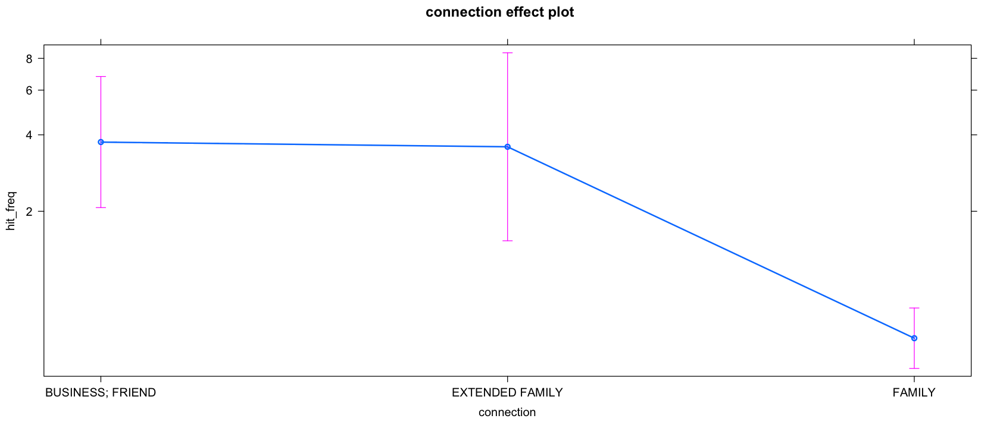

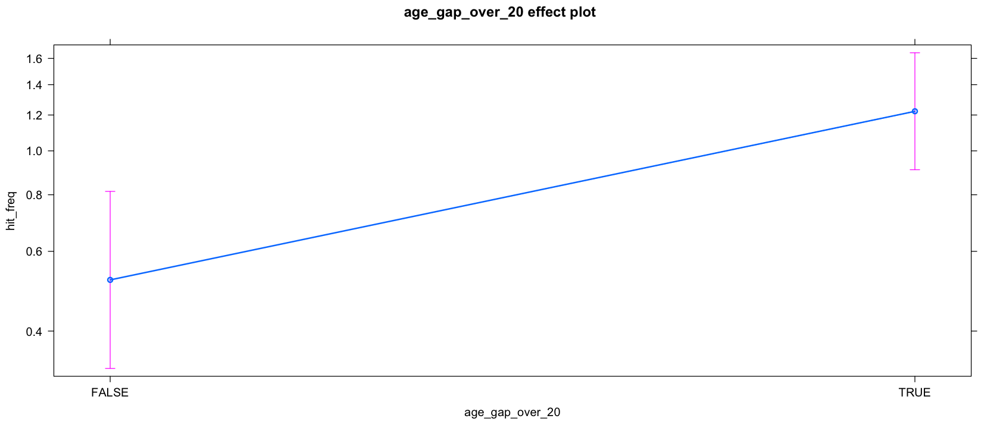

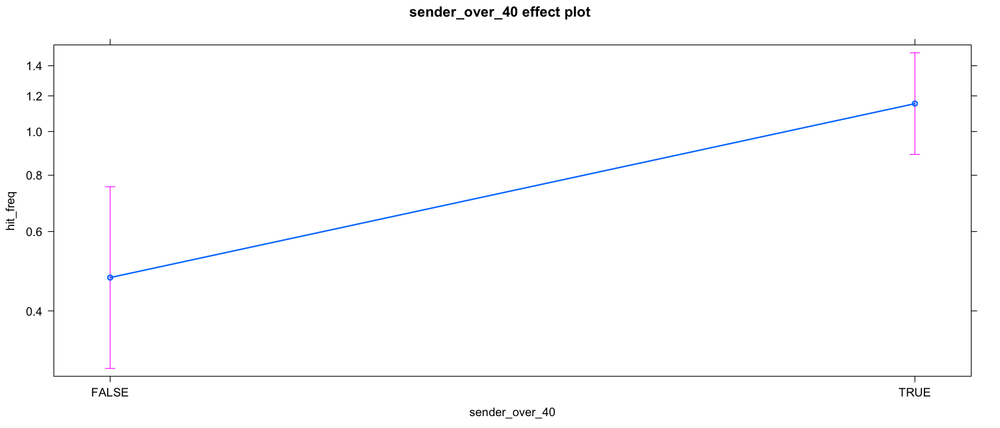

In [74]:
j_glmer8 <- glmer(hit_freq ~ connection + age_gap_over_20 + sender_over_40 + (1|sender),
                  data=j_conn_sig,
                  family=negative.binomial(theta = 1),
                  nAGQ=0L)
summary(j_glmer8)

"------------------------------dispersion------------------------------"
dispersion_glmer(j_glmer8)

"------------------------------drop1------------------------------"
drop1(j_glmer8, test = "Chisq")

effect("connection", j_glmer8)
effect("age_gap_over_20", j_glmer8)
effect("sender_over_40", j_glmer8)

plot(effect("connection", j_glmer8))
plot(effect("age_gap_over_20", j_glmer8))
plot(effect("sender_over_40", j_glmer8))

There is zero variance and standard deviance in the random effect. This could indicate model overfitting, or difficulties for the model to estimate the variability accurately. Either way, it seems that this model is too complex for the data at hand.

### 9.2 Generalised linear mixed-effects model using previously significant predictors as fixed effects, and "pair" as random effect, negative binomial

Generalized linear mixed model fit by maximum likelihood (Adaptive
  Gauss-Hermite Quadrature, nAGQ = 0) [glmerMod]
 Family: Negative Binomial(1)  ( log )
Formula: hit_freq ~ connection + age_gap_over_20 + sender_over_40 + (1 |  
    pair)
   Data: j_conn_sig

     AIC      BIC   logLik deviance df.resid 
   516.4    539.0   -251.2    502.4      179 

Scaled residuals: 
    Min      1Q  Median      3Q     Max 
-0.9355 -0.7436 -0.5805 -0.1208  6.3507 

Random effects:
 Groups Name        Variance Std.Dev.
 pair   (Intercept) 0        0       
Number of obs: 186, groups:  pair, 24

Fixed effects:
                          Estimate Std. Error z value Pr(>|z|)    
(Intercept)                0.24441    0.35250   0.693  0.48809    
connectionEXTENDED FAMILY -0.04303    0.55654  -0.077  0.93837    
connectionFAMILY          -1.77857    0.35339  -5.033 4.83e-07 ***
age_gap_over_20TRUE        0.85751    0.29501   2.907  0.00365 ** 
sender_over_40TRUE         0.88920    0.27032   3.289  0.00100 

[1] "------------------------------dispersion------------------------------"

[1] 1.22352

[1] "------------------------------drop1------------------------------"

,Df,AIC,LRT,Pr(Chi)
<none>,NA,516.4113,NA,NA
connection,2,520.8557,8.444478,0.01466577
age_gap_over_20,1,516.1001,1.688823,0.19375622
sender_over_40,1,519.9242,5.512943,0.01887625



 connection effect
connection
BUSINESS; FRIEND  EXTENDED FAMILY           FAMILY 
       3.7469728        3.5891641        0.6327858 


 age_gap_over_20 effect
age_gap_over_20
    FALSE      TRUE 
0.5188642 1.2231106 


 sender_over_40 effect
sender_over_40
    FALSE      TRUE 
0.4742352 1.1538991 

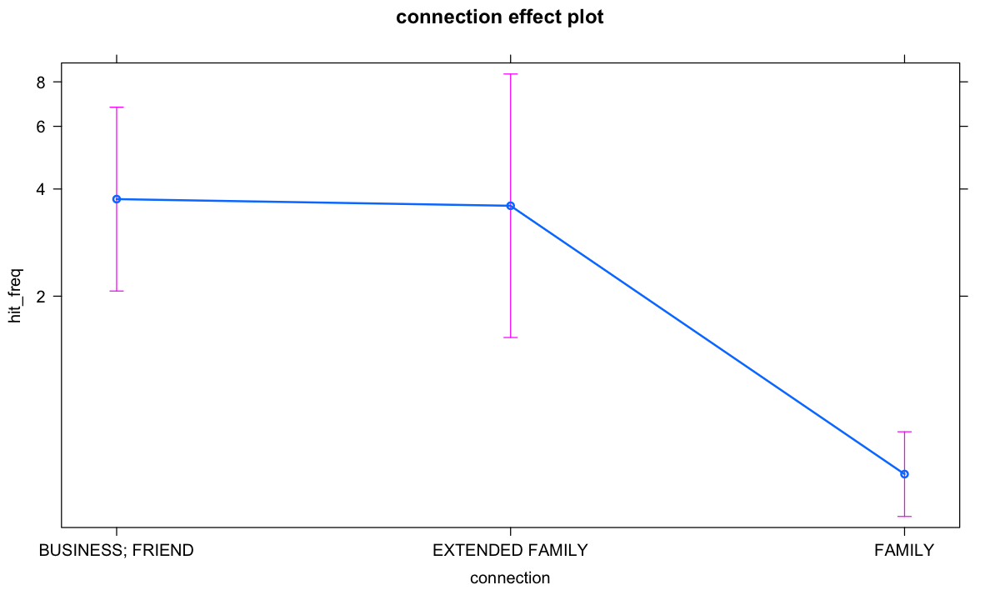

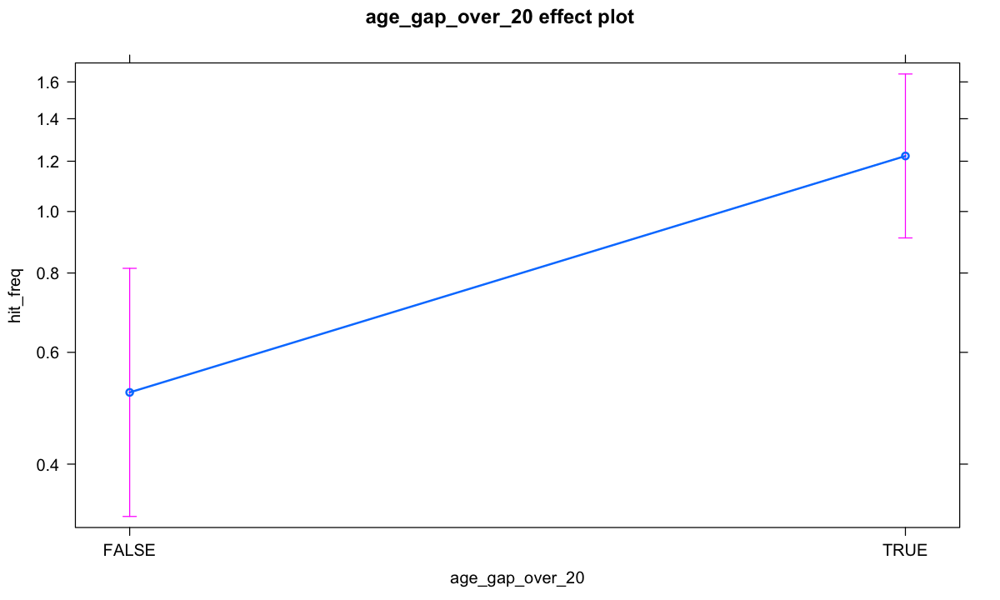

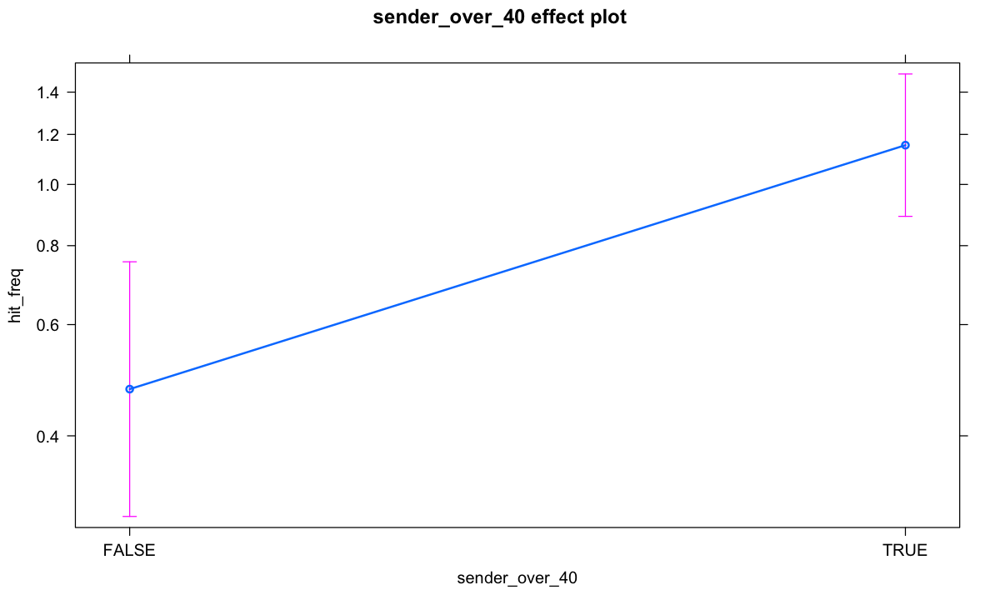

In [86]:
#addressee_over_40 is added due to it being a significant predictor while using "pair" as random effect

j_glmer8b <- glmer(hit_freq ~ connection + age_gap_over_20 + sender_over_40 + (1|pair),
                  data=j_conn_sig,
                  family=negative.binomial(theta = 1),
                  nAGQ=0L)

summary(j_glmer8b)

"------------------------------dispersion------------------------------"
dispersion_glmer(j_glmer8b)

"------------------------------drop1------------------------------"
drop1(j_glmer8b, test = "Chisq")

effect("connection", j_glmer8b)
effect("age_gap_over_20", j_glmer8b)
effect("sender_over_40", j_glmer8b)

plot(effect("connection", j_glmer8b))
plot(effect("age_gap_over_20", j_glmer8b))
plot(effect("sender_over_40", j_glmer8b))

The model shows that sender over 40 remains a significant predictor for the frequency of divine appeals. It has positive moderate correlation to FAMILY, which, in this model, is highly significant. It's overall effect, however, remains low.

### 9.3 Generalised linear mixed-effects model using previously significant predictors as fixed effects, and "sender" and "quinquennial" as random effects, negative binomial, without "FRIEND" variable

Generalized linear mixed model fit by maximum likelihood (Adaptive
  Gauss-Hermite Quadrature, nAGQ = 0) [glmerMod]
 Family: Negative Binomial(1)  ( log )
Formula: hit_freq ~ connection + age_gap_over_20 + sender_over_40 + (1 |  
    sender) + (1 | quinquennial)
   Data: jnf_sig

     AIC      BIC   logLik deviance df.resid 
   498.3    524.1   -241.2    482.3      178 

Scaled residuals: 
    Min      1Q  Median      3Q     Max 
-0.9508 -0.6554 -0.5418 -0.2815  8.1443 

Random effects:
 Groups       Name        Variance Std.Dev.
 quinquennial (Intercept) 0.3184   0.5643  
 sender       (Intercept) 0.0000   0.0000  
Number of obs: 186, groups:  quinquennial, 13; sender, 12

Fixed effects:
                          Estimate Std. Error z value Pr(>|z|)   
(Intercept)                 0.1281     0.4664   0.275  0.78365   
connectionEXTENDED FAMILY  -0.1519     0.6957  -0.218  0.82713   
connectionFAMILY           -1.4963     0.5002  -2.991  0.00278 **
age_gap_over_20TRUE         0.7355    

[1] "------------------------------dispersion------------------------------"

[1] 1.151255

[1] "------------------------------drop1------------------------------"

,Df,AIC,LRT,Pr(Chi)
<none>,NA,498.3314,NA,NA
connection,2,501.8584,7.526978,0.02320265
age_gap_over_20,1,499.7624,3.431014,0.06398279
sender_over_40,1,499.8877,3.556244,0.05932184



 connection effect
connection
BUSINESS; FRIEND  EXTENDED FAMILY           FAMILY 
       2.7155718        2.3328063        0.6081888 


 age_gap_over_20 effect
age_gap_over_20
    FALSE      TRUE 
0.5082709 1.0605596 


 sender_over_40 effect
sender_over_40
    FALSE      TRUE 
0.4958829 0.9814796 

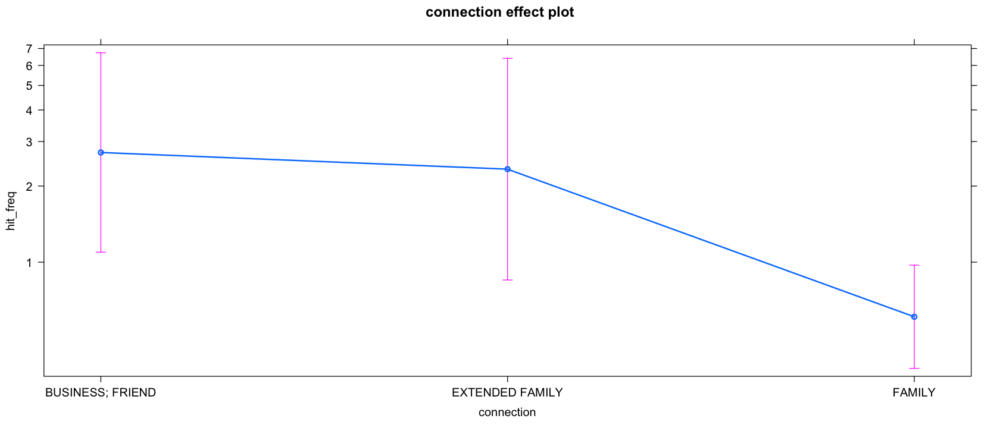

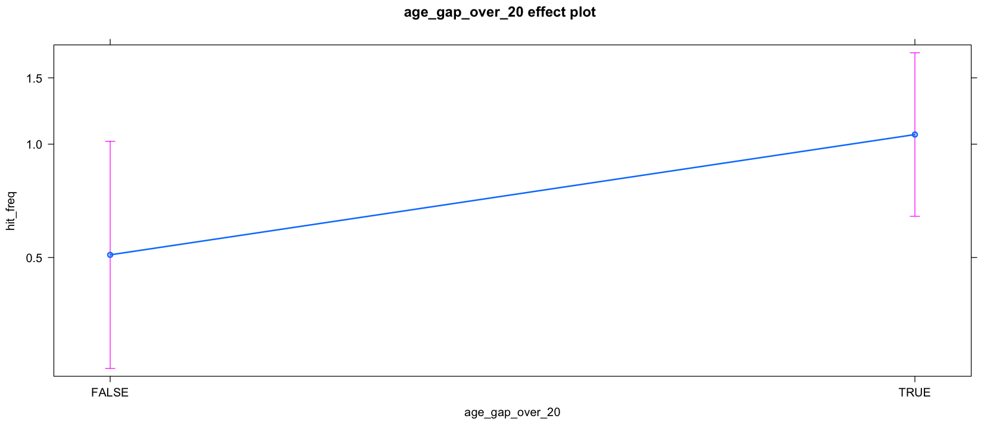

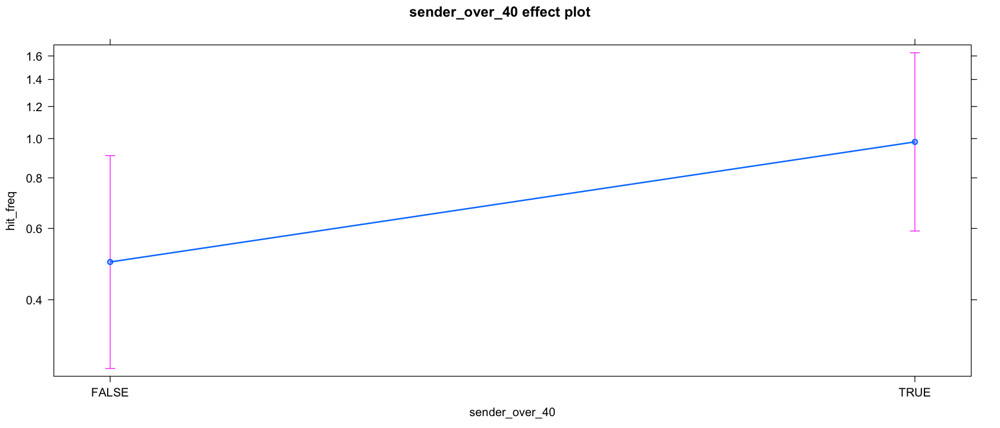

In [78]:
j_glmer8e <- glmer(hit_freq ~ connection + age_gap_over_20 + sender_over_40 + (1|sender) + (1|quinquennial),
                  data=jnf_sig,
                  family=negative.binomial(theta = 1),
                  nAGQ=0L)

summary(j_glmer8e)

"------------------------------dispersion------------------------------"
dispersion_glmer(j_glmer8e)

"------------------------------drop1------------------------------"
drop1(j_glmer8e, test = "Chisq")

effect("connection", j_glmer8e)
effect("age_gap_over_20", j_glmer8e)
effect("sender_over_40", j_glmer8e)

plot(effect("connection", j_glmer8e))
plot(effect("age_gap_over_20", j_glmer8e))
plot(effect("sender_over_40", j_glmer8e))

The models remain unreliable, with the variance of the sender effect consistently being zero.

### 10.0 Linear model tests

In [79]:
j_lm1 <- lm(hit_freq ~ connection + age_gap,
            data=jeake_conn)

summary(j_lm1)
"------- drop 1 -------"
#drop1(j_lmer1, test="Chisq")


Call:
lm(formula = hit_freq ~ connection + age_gap, data = jeake_conn)

Residuals:
    Min      1Q  Median      3Q     Max 
-8.0067 -1.1850 -0.5781 -0.0036 17.9967 

Coefficients:
                          Estimate Std. Error t value Pr(>|t|)    
(Intercept)                2.72654    0.76462   3.566 0.000488 ***
connectionEXTENDED FAMILY  4.02299    1.75084   2.298 0.022968 *  
connectionFAMILY          -2.79870    0.90884  -3.079 0.002470 ** 
connectionFRIEND          -1.40998    3.56890  -0.395 0.693352    
age_gap                    0.04335    0.03428   1.265 0.208014    
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 3.497 on 149 degrees of freedom
  (118 observations deleted due to missingness)
Multiple R-squared:  0.1736,	Adjusted R-squared:  0.1514 
F-statistic: 7.826 on 4 and 149 DF,  p-value: 9.416e-06


[1] "------- drop 1 -------"


 connection effect
connection
BUSINESS; FRIEND  EXTENDED FAMILY           FAMILY           FRIEND 
        3.579172         7.602164         0.780469         2.169189 


 age_gap effect
age_gap
        2        10        20        30        40 
0.7254918 1.0722886 1.5057846 1.9392806 2.3727766 

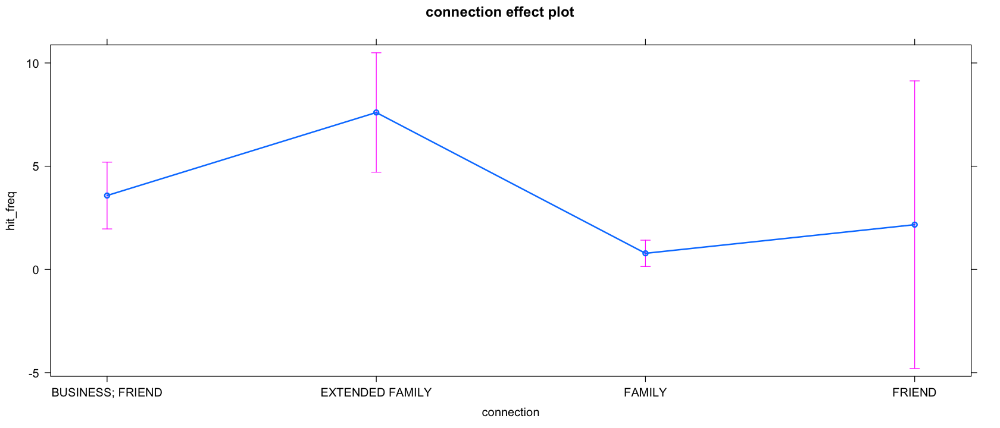

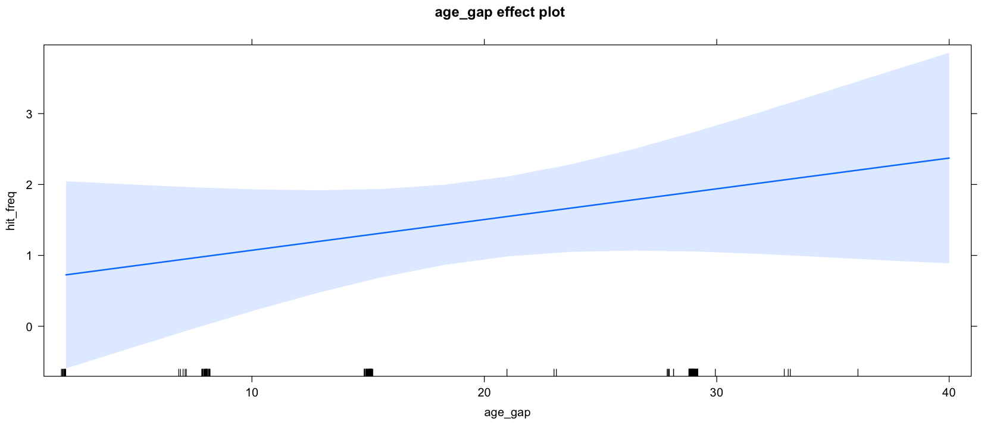

In [80]:
effect("connection", j_lm1)
effect("age_gap", j_lm1)
plot(effect("connection", j_lm1))
plot(effect("age_gap", j_lm1))
 
par(cex.axis = 0.8)

# Increase the resolution of the plot (in inches)
options(repr.plot.width = 10, repr.plot.height = 6)


Call:
lm(formula = hit_freq ~ connection + age_gap, data = jeake_nofriend)

Residuals:
    Min      1Q  Median      3Q     Max 
-8.0067 -1.1850 -0.5781 -0.0145 17.9967 

Coefficients:
                          Estimate Std. Error t value Pr(>|t|)    
(Intercept)                2.72654    0.76462   3.566 0.000488 ***
connectionEXTENDED FAMILY  4.02299    1.75084   2.298 0.022968 *  
connectionFAMILY          -2.79870    0.90884  -3.079 0.002470 ** 
age_gap                    0.04335    0.03428   1.265 0.208014    
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 3.497 on 149 degrees of freedom
  (115 observations deleted due to missingness)
Multiple R-squared:  0.1736,	Adjusted R-squared:  0.157 
F-statistic: 10.43 on 3 and 149 DF,  p-value: 2.842e-06



 connection effect
connection
BUSINESS; FRIEND  EXTENDED FAMILY           FAMILY 
       3.5827619        7.6057537        0.7840585 


 age_gap effect
age_gap
       2       10       20       30       40 
0.721062 1.067859 1.501355 1.934851 2.368347 

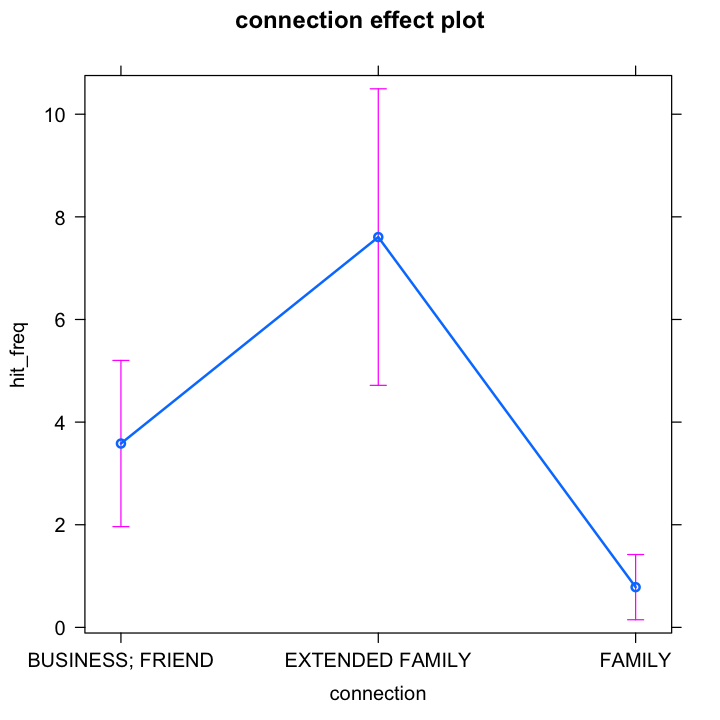

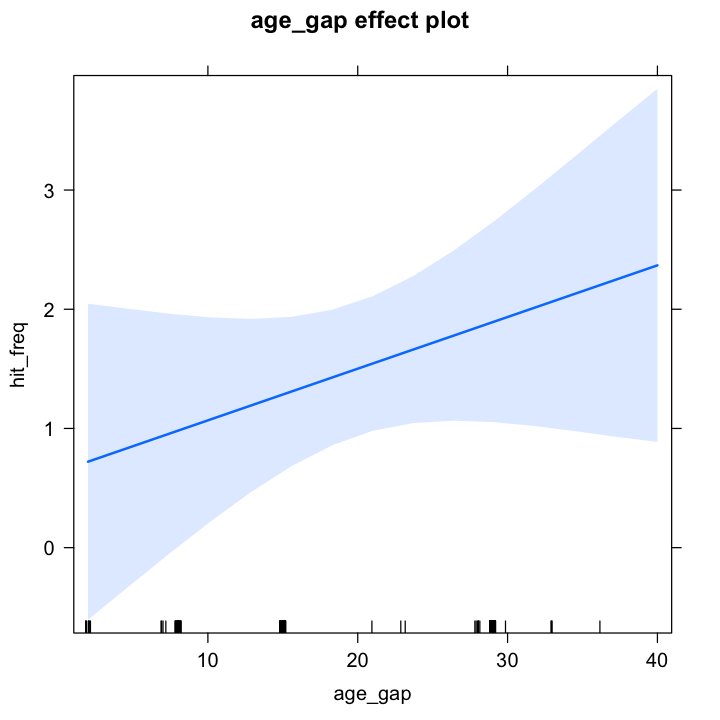

In [59]:
j_lm2 <- lm(hit_freq ~ connection + age_gap,
            data=jeake_nofriend)
summary(j_lm2)

effect("connection", j_lm2)
effect("age_gap", j_lm2)
plot(effect("connection", j_lm2))
plot(effect("age_gap", j_lm2))
 
par(cex.axis = 0.8)

# Increase the resolution of the plot (in inches)
options(repr.plot.width = 6, repr.plot.height = 6)

## Appendix: failed experiments
### Mixed model using "decennium" and "connection" as a predictor and "sender" as a random effect

In [82]:
glmer(hit_freq ~ decennium + connection + (1|sender), data=jeake_conn, family=poisson)

Warning message in (function (fr, X, reTrms, family, nAGQ = 1L, verbose = 0L, maxit = 100L, :
“non-integer x = 281.580000”Warning message in (function (fr, X, reTrms, family, nAGQ = 1L, verbose = 0L, maxit = 100L, :
“non-integer x = 442.480000”Warning message in (function (fr, X, reTrms, family, nAGQ = 1L, verbose = 0L, maxit = 100L, :
“non-integer x = 1.690000”Warning message in (function (fr, X, reTrms, family, nAGQ = 1L, verbose = 0L, maxit = 100L, :
“non-integer x = 10.110000”Warning message in (function (fr, X, reTrms, family, nAGQ = 1L, verbose = 0L, maxit = 100L, :
“non-integer x = 15.170000”Warning message in (function (fr, X, reTrms, family, nAGQ = 1L, verbose = 0L, maxit = 100L, :
“non-integer x = 1.690000”Warning message in (function (fr, X, reTrms, family, nAGQ = 1L, verbose = 0L, maxit = 100L, :
“non-integer x = 10.110000”Warning message in (function (fr, X, reTrms, family, nAGQ = 1L, verbose = 0L, maxit = 100L, :
“non-integer x = 1.690000”Warning message in (function (fr,

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GHrule(0L), compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GHrule(0L), compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GHrule(0L), compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GHrule(0L), compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GHrule(0L), compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GHrule(0L), compDev = compDev, :
“non-integer x = 13.730000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GHrule(0L), compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GHrule(0L), compDev = compDev, :
“non-i

“non-integer x = 13.730000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GHrule(0L), compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GHrule(0L), compDev = compDev, :
“non-integer x = 1.620000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GHrule(0L), compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GHrule(0L), compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GHrule(0L), compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GHrule(0L), compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GHrule(0L), compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GHrule(0L), compDev = compDev, :
“non

“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GHrule(0L), compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GHrule(0L), compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GHrule(0L), compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GHrule(0L), compDev = compDev, :
“non-integer x = 321.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GHrule(0L), compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GHrule(0L), compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GHrule(0L), compDev = compDev, :
“non-integer x = 6.740000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GHrule(0L), compDev = compDev, :
“non

“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GHrule(0L), compDev = compDev, :
“non-integer x = 6.740000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GHrule(0L), compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GHrule(0L), compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GHrule(0L), compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GHrule(0L), compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GHrule(0L), compDev = compDev, :
“non-integer x = 11.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GHrule(0L), compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GHrule(0L), compDev = compDev, :
“non-i

“non-integer x = 11.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GHrule(0L), compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GHrule(0L), compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GHrule(0L), compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GHrule(0L), compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GHrule(0L), compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GHrule(0L), compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GHrule(0L), compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GHrule(0L), compDev = compDev, :
“non

“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GHrule(0L), compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GHrule(0L), compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GHrule(0L), compDev = compDev, :
“non-integer x = 5.060000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GHrule(0L), compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GHrule(0L), compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GHrule(0L), compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GHrule(0L), compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GHrule(0L), compDev = compDev, :
“no

“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GHrule(0L), compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GHrule(0L), compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GHrule(0L), compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GHrule(0L), compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GHrule(0L), compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GHrule(0L), compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GHrule(0L), compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GHrule(0L), compDev = compDev, :
“non-in

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GHrule(0L), compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GHrule(0L), compDev = compDev, :
“non-integer x = 8.430000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GHrule(0L), compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GHrule(0L), compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GHrule(0L), compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GHrule(0L), compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GHrule(0L), compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GHrule(0L), compDev = compDev, :
“non-int

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GHrule(0L), compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GHrule(0L), compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GHrule(0L), compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GHrule(0L), compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GHrule(0L), compDev = compDev, :
“non-integer x = 281.580000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GHrule(0L), compDev = compDev, :
“non-integer x = 442.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GHrule(0L), compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GHrule(0L), compDev = compDev, :
“non

“non-integer x = 442.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GHrule(0L), compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GHrule(0L), compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GHrule(0L), compDev = compDev, :
“non-integer x = 15.170000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GHrule(0L), compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GHrule(0L), compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GHrule(0L), compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GHrule(0L), compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GHrule(0L), compDev = compDev, :
“no

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GHrule(0L), compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GHrule(0L), compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GHrule(0L), compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GHrule(0L), compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GHrule(0L), compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GHrule(0L), compDev = compDev, :
“non-integer x = 13.730000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GHrule(0L), compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GHrule(0L), compDev = compDev, :
“non-i

“non-integer x = 13.730000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GHrule(0L), compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GHrule(0L), compDev = compDev, :
“non-integer x = 1.620000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GHrule(0L), compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GHrule(0L), compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GHrule(0L), compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GHrule(0L), compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GHrule(0L), compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GHrule(0L), compDev = compDev, :
“non

“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GHrule(0L), compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GHrule(0L), compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GHrule(0L), compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GHrule(0L), compDev = compDev, :
“non-integer x = 321.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GHrule(0L), compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GHrule(0L), compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GHrule(0L), compDev = compDev, :
“non-integer x = 6.740000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GHrule(0L), compDev = compDev, :
“non

“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GHrule(0L), compDev = compDev, :
“non-integer x = 6.740000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GHrule(0L), compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GHrule(0L), compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GHrule(0L), compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GHrule(0L), compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GHrule(0L), compDev = compDev, :
“non-integer x = 11.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GHrule(0L), compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GHrule(0L), compDev = compDev, :
“non-i

“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in p

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 8.430000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwr

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 281.580000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 442.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 15.170000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 13.730000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.620000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in p

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 321.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message i

“non-integer x = 6.740000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 11.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in p

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 5.060000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message i

“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 8.430000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pw

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 281.580000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 442.480000”Warning message in

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 15.170000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in 

“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 13.730000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.620000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in

“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 321.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.740000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in 

“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 11.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in

“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 5.060000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 8.430000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwr

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 281.580000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 442.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 15.170000”Warning message 

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 13.730000”Warning message in 

“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.620000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in 

“non-integer x = 321.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.740000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 11.800000”Warning message in

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 5.060000”Warning message in

“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in p

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 8.430000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwr

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 281.580000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 442.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 15.170000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 13.730000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.620000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in p

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 321.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message i

“non-integer x = 6.740000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 11.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in p

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 5.060000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message i

“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 8.430000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pw

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 281.580000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 442.480000”Warning message in

“non-integer x = 281.580000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 442.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 15.170000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 13.730000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.620000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in p

“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 321.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.740000”Warning message i

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 11.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in p

“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 5.060000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message 

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 8.430000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwr

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 281.580000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 442.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in

“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 15.170000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in 

“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 13.730000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.620000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message i

“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 321.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.740000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in 

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 11.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in

“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 5.060000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in 

“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 8.430000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwr

“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 281.580000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 442.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 15.170000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message 

“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 13.730000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in 

“non-integer x = 1.620000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 321.800000”Warning message i

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.740000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 11.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in p

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 5.060000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message i

“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pw

“non-integer x = 8.430000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwr

“non-integer x = 281.580000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 442.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 15.170000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 13.730000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.620000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in p

“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 321.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.740000”Warning message i

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 11.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in p

“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 5.060000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message 

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 8.430000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwr

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 281.580000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 442.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in

“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 15.170000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in 

“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 13.730000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.620000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message i

“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 321.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.740000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in 

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 11.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in

“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 5.060000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in 

“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 8.430000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwr

“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 281.580000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 442.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 15.170000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message 

“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 13.730000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in 

“non-integer x = 1.620000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 321.800000”Warning message i

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.740000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 11.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in p

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 5.060000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message i

“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pw

“non-integer x = 8.430000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwr

“non-integer x = 281.580000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 442.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 15.170000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 13.730000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.620000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in p

“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 321.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.740000”Warning message i

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 11.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in p

“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 5.060000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message 

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 8.430000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwr

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 281.580000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 442.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in

“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 15.170000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in 

“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 13.730000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.620000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message i

“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 321.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.740000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in 

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 11.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in

“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 5.060000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in 

“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 8.430000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwr

“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 281.580000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 442.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 15.170000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message 

“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 13.730000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in 

“non-integer x = 1.620000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 321.800000”Warning message i

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.740000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 11.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in p

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 5.060000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message i

“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pw

“non-integer x = 8.430000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwr

“non-integer x = 281.580000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 442.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 15.170000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 13.730000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.620000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in p

“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 321.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.740000”Warning message i

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 11.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in p

“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 5.060000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message 

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 8.430000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwr

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 281.580000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 442.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in

“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 15.170000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in 

“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 13.730000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.620000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message i

“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 321.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.740000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in 

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 11.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in

“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 5.060000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in 

“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 8.430000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwr

“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 281.580000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 442.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 15.170000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message 

“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 13.730000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in 

“non-integer x = 1.620000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 321.800000”Warning message i

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.740000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 11.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in p

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 5.060000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message i

“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pw

“non-integer x = 8.430000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwr

“non-integer x = 281.580000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 442.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 15.170000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 13.730000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.620000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in p

“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 321.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.740000”Warning message i

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 11.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in p

“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 5.060000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message 

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 8.430000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwr

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 281.580000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 442.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in

“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 15.170000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in 

“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 13.730000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.620000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message i

“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 321.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.740000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in 

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 11.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in

“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 5.060000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in 

“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 8.430000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwr

“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 281.580000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 442.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 15.170000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message 

“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 13.730000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in 

“non-integer x = 1.620000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 321.800000”Warning message i

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.740000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 11.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in p

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 5.060000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message i

“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pw

“non-integer x = 8.430000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwr

“non-integer x = 281.580000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 442.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 15.170000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 13.730000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.620000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in p

“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 321.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.740000”Warning message i

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 11.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in p

“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 5.060000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message 

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 8.430000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwr

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 281.580000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 442.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in

“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 15.170000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in 

“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 13.730000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.620000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message i

“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 321.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.740000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in 

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 11.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in

“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 5.060000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in 

“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 8.430000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwr

“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 281.580000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 442.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 15.170000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message 

“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 13.730000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in 

“non-integer x = 1.620000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 321.800000”Warning message i

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.740000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 11.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in p

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 5.060000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message i

“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pw

“non-integer x = 8.430000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwr

“non-integer x = 281.580000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 442.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 15.170000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 13.730000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.620000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in p

“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 321.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.740000”Warning message i

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 11.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in p

“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 5.060000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message 

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 8.430000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwr

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 281.580000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 442.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in

“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 15.170000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in 

“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 13.730000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.620000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message i

“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 321.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.740000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in 

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 11.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in

“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 5.060000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in 

“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 8.430000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwr

“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 281.580000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 442.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 15.170000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message 

“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 13.730000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in 

“non-integer x = 1.620000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 321.800000”Warning message i

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.740000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 11.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in p

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 5.060000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message i

“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pw

“non-integer x = 8.430000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwr

“non-integer x = 281.580000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 442.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 15.170000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 13.730000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.620000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in p

“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 321.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.740000”Warning message i

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 11.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in p

“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 5.060000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message 

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 8.430000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwr

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 281.580000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 442.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in

“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 15.170000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in 

“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 13.730000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.620000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message i

“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 321.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.740000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in 

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 11.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in

“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 5.060000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in 

“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 8.430000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwr

“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 281.580000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 442.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 15.170000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message 

“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 13.730000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in 

“non-integer x = 1.620000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 321.800000”Warning message i

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.740000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 11.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in p

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 5.060000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message i

“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pw

“non-integer x = 8.430000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwr

“non-integer x = 281.580000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 442.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 15.170000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 13.730000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.620000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in p

“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 321.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.740000”Warning message i

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 11.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in p

“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 5.060000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message 

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 8.430000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwr

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 281.580000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 442.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in

“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 15.170000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in 

“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 13.730000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.620000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message i

“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 321.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.740000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in 

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 11.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in

“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 5.060000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in 

“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 8.430000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwr

“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 281.580000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 442.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 15.170000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message 

“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 13.730000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in 

“non-integer x = 1.620000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 321.800000”Warning message i

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.740000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 11.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in p

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 5.060000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message i

“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pw

“non-integer x = 8.430000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwr

“non-integer x = 281.580000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 442.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 15.170000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 13.730000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.620000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in p

“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 321.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.740000”Warning message i

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 11.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in p

“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 5.060000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message 

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 8.430000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwr

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 281.580000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 442.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in

“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 15.170000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in 

“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 13.730000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.620000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message i

“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 321.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.740000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in 

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 11.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in

“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 5.060000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in 

“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 8.430000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwr

“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 281.580000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 442.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 15.170000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message 

“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 13.730000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in 

“non-integer x = 1.620000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 321.800000”Warning message i

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.740000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 11.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in p

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 5.060000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message i

“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pw

“non-integer x = 8.430000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwr

“non-integer x = 281.580000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 442.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 15.170000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 13.730000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.620000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in p

“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 321.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.740000”Warning message i

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 11.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in p

“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 5.060000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message 

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 8.430000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwr

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 281.580000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 442.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in

“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 15.170000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in 

“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 13.730000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.620000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message i

“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 321.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.740000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in 

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 11.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in

“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 5.060000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in 

“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 8.430000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwr

“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 281.580000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 442.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 15.170000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message 

“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 13.730000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in 

“non-integer x = 1.620000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 321.800000”Warning message i

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.740000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 11.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in p

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 5.060000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message i

“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pw

“non-integer x = 8.430000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwr

“non-integer x = 281.580000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 442.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 15.170000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 13.730000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.620000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in p

“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 321.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.740000”Warning message i

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 11.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in p

“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 5.060000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message 

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 8.430000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwr

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 281.580000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 442.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in

“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 15.170000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in 

“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 13.730000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.620000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message i

“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 321.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.740000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in 

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 11.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in

“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 5.060000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in 

“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 8.430000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwr

“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 281.580000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 442.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 15.170000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message 

“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 13.730000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in 

“non-integer x = 1.620000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 321.800000”Warning message i

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.740000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 11.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in p

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 5.060000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message i

“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pw

“non-integer x = 8.430000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwr

“non-integer x = 281.580000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 442.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 15.170000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 13.730000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.620000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in p

“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 321.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.740000”Warning message i

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 11.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in p

“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 5.060000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message 

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 8.430000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwr

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 281.580000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 442.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in

“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 15.170000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in 

“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 13.730000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.620000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message i

“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 321.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.740000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in 

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 11.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in

“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 5.060000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in 

“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 8.430000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwr

“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 281.580000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 442.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 15.170000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message 

“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 13.730000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in 

“non-integer x = 1.620000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 321.800000”Warning message i

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.740000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 11.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in p

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 5.060000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message i

“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pw

“non-integer x = 8.430000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwr

“non-integer x = 281.580000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 442.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 15.170000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 13.730000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.620000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in p

“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 321.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.740000”Warning message i

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 11.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in p

“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 5.060000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message 

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 8.430000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwr

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 281.580000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 442.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in

“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 15.170000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in 

“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 13.730000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.620000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message i

“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 321.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.740000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in 

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 11.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in

“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 5.060000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in 

“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 8.430000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwr

“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 281.580000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 442.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 15.170000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message 

“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 13.730000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in 

“non-integer x = 1.620000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 321.800000”Warning message i

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.740000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 11.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in p

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 5.060000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message i

“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pw

“non-integer x = 8.430000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwr

“non-integer x = 281.580000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 442.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 15.170000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 13.730000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.620000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in p

“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 321.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.740000”Warning message i

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 11.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in p

“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 5.060000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message 

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 8.430000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwr

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 281.580000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 442.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in

“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 15.170000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in 

“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 13.730000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.620000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message i

“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 321.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.740000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in 

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 11.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in

“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 5.060000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in 

“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 8.430000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwr

“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 281.580000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 442.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 15.170000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message 

“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 13.730000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in 

“non-integer x = 1.620000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 321.800000”Warning message i

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.740000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 11.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in p

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 5.060000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message i

“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pw

“non-integer x = 8.430000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwr

“non-integer x = 281.580000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 442.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 15.170000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 13.730000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.620000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in p

“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 321.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.740000”Warning message i

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 11.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in p

“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 5.060000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message 

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 8.430000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwr

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 281.580000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 442.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in

“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 15.170000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in 

“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 13.730000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.620000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message i

“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 321.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.740000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in 

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 11.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in

“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 5.060000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in 

“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 8.430000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwr

“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 281.580000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 442.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 15.170000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message 

“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 13.730000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in 

“non-integer x = 1.620000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 321.800000”Warning message i

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.740000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 11.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in p

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 5.060000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message i

“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pw

“non-integer x = 8.430000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwr

“non-integer x = 281.580000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 442.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 15.170000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 13.730000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.620000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in p

“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 321.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.740000”Warning message i

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 11.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in p

“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 5.060000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message 

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 8.430000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwr

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 281.580000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 442.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in

“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 15.170000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in 

“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 13.730000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.620000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message i

“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 321.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.740000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in 

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 11.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in

“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 5.060000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in 

“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 8.430000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwr

“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 281.580000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 442.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 15.170000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message 

“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 13.730000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in 

“non-integer x = 1.620000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 321.800000”Warning message i

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.740000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 11.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in p

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 5.060000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message i

“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pw

“non-integer x = 8.430000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwr

“non-integer x = 281.580000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 442.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 15.170000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 13.730000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.620000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in p

“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 321.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.740000”Warning message i

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 11.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in p

“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 5.060000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message 

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 8.430000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwr

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 281.580000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 442.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in

“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 15.170000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in 

“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 13.730000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.620000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message i

“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 321.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.740000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in 

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 11.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in

“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 5.060000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in 

“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 8.430000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwr

“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 281.580000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 442.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 15.170000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message 

“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 13.730000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in 

“non-integer x = 1.620000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 321.800000”Warning message i

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.740000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 11.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in p

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 5.060000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message i

“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pw

“non-integer x = 8.430000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwr

“non-integer x = 281.580000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 442.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 15.170000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 13.730000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.620000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in p

“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 321.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.740000”Warning message i

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 11.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in p

“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 5.060000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message 

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 8.430000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwr

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 281.580000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 442.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in

“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 15.170000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in 

“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 13.730000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.620000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message i

“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 321.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.740000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in 

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 11.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in

“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 5.060000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in 

“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 8.430000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwr

“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 281.580000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 442.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 15.170000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message 

“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 13.730000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in 

“non-integer x = 1.620000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 321.800000”Warning message i

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.740000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 11.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in p

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 5.060000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message i

“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pw

“non-integer x = 8.430000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwr

“non-integer x = 281.580000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 442.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 15.170000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 13.730000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.620000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in p

“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 321.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.740000”Warning message i

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 11.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in p

“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 5.060000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message 

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 8.430000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwr

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 281.580000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 442.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in

“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 15.170000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in 

“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 13.730000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.620000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message i

“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 321.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.740000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in 

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 11.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in

“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 5.060000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in 

“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 8.430000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwr

“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 281.580000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 442.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 15.170000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message 

“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 13.730000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in 

“non-integer x = 1.620000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 321.800000”Warning message i

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.740000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 11.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in p

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 5.060000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message i

“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pw

“non-integer x = 8.430000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwr

“non-integer x = 281.580000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 442.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 15.170000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 13.730000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.620000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in p

“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 321.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.740000”Warning message i

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 11.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in p

“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 5.060000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message 

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 8.430000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwr

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 281.580000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 442.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in

“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 15.170000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in 

“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 13.730000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.620000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message i

“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 321.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.740000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in 

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 11.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in

“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 5.060000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in 

“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 8.430000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwr

“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 281.580000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 442.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 15.170000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message 

“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 13.730000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in 

“non-integer x = 1.620000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 321.800000”Warning message i

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.740000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 11.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in p

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 5.060000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message i

“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pw

“non-integer x = 8.430000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwr

“non-integer x = 281.580000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 442.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 15.170000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 13.730000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.620000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in p

“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 321.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.740000”Warning message i

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 11.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in p

“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 5.060000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message 

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 8.430000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwr

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 281.580000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 442.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in

“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 15.170000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in 

“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 13.730000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.620000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message i

“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 321.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.740000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in 

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 11.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in

“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 5.060000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in 

“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 8.430000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwr

“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 281.580000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 442.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 15.170000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message 

“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 13.730000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in 

“non-integer x = 1.620000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 321.800000”Warning message i

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.740000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 11.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in p

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 5.060000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message i

“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pw

“non-integer x = 8.430000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwr

“non-integer x = 281.580000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 442.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 15.170000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 13.730000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.620000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in p

“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 321.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.740000”Warning message i

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 11.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in p

“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 5.060000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message 

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 8.430000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwr

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 281.580000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 442.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in

“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 15.170000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in 

“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 13.730000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.620000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message i

“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 321.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.740000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in 

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 11.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in

“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 5.060000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in 

“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 8.430000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwr

“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 281.580000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 442.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 15.170000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message 

“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 13.730000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in 

“non-integer x = 1.620000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 321.800000”Warning message i

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.740000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 11.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in p

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 5.060000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message i

“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pw

“non-integer x = 8.430000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwr

“non-integer x = 281.580000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 442.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 15.170000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 13.730000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.620000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in p

“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 321.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.740000”Warning message i

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 11.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in p

“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 5.060000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message 

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 8.430000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwr

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 281.580000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 442.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in

“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 15.170000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in 

“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 13.730000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.620000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message i

“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 321.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.740000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in 

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 11.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in

“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 5.060000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in 

“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 8.430000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwr

“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 281.580000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 442.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 15.170000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message 

“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 13.730000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in 

“non-integer x = 1.620000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 321.800000”Warning message i

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.740000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 11.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in p

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 5.060000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message i

“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pw

“non-integer x = 8.430000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwr

“non-integer x = 281.580000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 442.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 15.170000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 13.730000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.620000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in p

“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 321.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.740000”Warning message i

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 11.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in p

“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 5.060000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message 

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 8.430000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwr

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 281.580000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 442.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in

“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 15.170000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in 

“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 13.730000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.620000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message i

“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 321.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.740000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in 

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 11.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in

“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 5.060000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in 

“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 8.430000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwr

“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 281.580000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 442.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 15.170000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message 

“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 13.730000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in 

“non-integer x = 1.620000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 321.800000”Warning message i

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.740000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 11.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in p

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 5.060000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message i

“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pw

“non-integer x = 8.430000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwr

“non-integer x = 281.580000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 442.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 15.170000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 13.730000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.620000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in p

“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 321.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.740000”Warning message i

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 11.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in p

“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 5.060000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message 

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 8.430000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwr

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 281.580000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 442.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in

“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 15.170000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in 

“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 13.730000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.620000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message i

“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 321.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.740000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in 

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 11.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in

“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 5.060000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in 

“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 8.430000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwr

“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 281.580000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 442.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 15.170000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message 

“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 13.730000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in 

“non-integer x = 1.620000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 321.800000”Warning message i

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.740000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 11.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in p

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 5.060000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message i

“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pw

“non-integer x = 8.430000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwr

“non-integer x = 281.580000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 442.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 15.170000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 13.730000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.620000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in p

“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 321.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.740000”Warning message i

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 11.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in p

“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 5.060000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message 

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 8.430000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwr

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 281.580000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 442.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in

“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 15.170000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in 

“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 13.730000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.620000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message i

“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 321.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.740000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in 

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 11.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in

“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 5.060000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in 

“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 8.430000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwr

“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 281.580000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 442.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 15.170000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message 

“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 13.730000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in 

“non-integer x = 1.620000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 321.800000”Warning message i

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.740000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 11.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in p

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 5.060000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message i

“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pw

“non-integer x = 8.430000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwr

“non-integer x = 281.580000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 442.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 15.170000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 13.730000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.620000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in p

“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 321.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.740000”Warning message i

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 11.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in p

“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 5.060000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message 

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 8.430000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwr

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 281.580000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 442.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in

“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 15.170000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in 

“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 13.730000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.620000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message i

“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 321.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.740000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in 

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 11.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in

“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 5.060000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in 

“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 8.430000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwr

“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 281.580000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 442.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 15.170000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message 

“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 13.730000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in 

“non-integer x = 1.620000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 321.800000”Warning message i

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.740000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 11.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in p

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 5.060000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message i

“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pw

“non-integer x = 8.430000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwr

“non-integer x = 281.580000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 442.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 15.170000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 13.730000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.620000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in p

“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 321.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.740000”Warning message i

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 11.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in p

“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 5.060000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message 

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 8.430000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwr

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 281.580000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 442.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in

“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 15.170000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in 

“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 13.730000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.620000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message i

“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 321.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.740000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in 

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 11.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in

“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 5.060000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in 

“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 8.430000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwr

“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 281.580000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 442.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 15.170000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message 

“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 13.730000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in 

“non-integer x = 1.620000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 321.800000”Warning message i

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.740000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 11.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in p

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 5.060000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message i

“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pw

“non-integer x = 8.430000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwr

“non-integer x = 281.580000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 442.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 15.170000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 13.730000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.620000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in p

“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 321.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.740000”Warning message i

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 11.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in p

“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 5.060000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message 

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 8.430000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwr

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 281.580000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 442.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in

“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 15.170000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in 

“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 13.730000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.620000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message i

“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 321.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.740000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in 

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 11.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in

“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 5.060000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in 

“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 8.430000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwr

“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 281.580000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 442.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 15.170000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message 

“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 13.730000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in 

“non-integer x = 1.620000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 16.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.860000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 321.800000”Warning message i

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 6.740000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 11.800000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in p

“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 20.590000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 5.060000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 21.070000”Warning message i

“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.540000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pw

“non-integer x = 8.430000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 3.370000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwr

“non-integer x = 281.580000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 442.480000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 15.170000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 10.110000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message in pwrssUpdate(pp, resp, tol = tolPwrss, GQmat = GQmat, compDev = compDev, :
“non-integer x = 1.690000”Warning message

Generalized linear mixed model fit by maximum likelihood (Laplace
  Approximation) [glmerMod]
 Family: poisson  ( log )
Formula: hit_freq ~ decennium + connection + (1 | sender)
   Data: jeake_conn
     AIC      BIC   logLik deviance df.resid 
     Inf      Inf     -Inf      Inf      256 
Random effects:
 Groups Name        Std.Dev.
 sender (Intercept) 1       
Number of obs: 272, groups:  sender, 33
Fixed Effects:
               (Intercept)          decennium1640-1649  
                    0.5408                     -0.4494  
        decennium1650-1659          decennium1660-1669  
                   -0.8066                     -1.6135  
        decennium1670-1679          decennium1680-1689  
                   -0.3876                     -0.6471  
        decennium1690-1699          decennium1700-1709  
                   -1.3674                     -1.5630  
        decennium1710-1719          decennium1720-1729  
                    0.4627                      0.3837  
        dec

The above model doesn't work, since quasipoisson doesn't work with mixed models, and rather than numeric values, poisson family only accepts integer values as response variables.

### Generalised linear model using "sender" as an interaction with "connection" predictor

In [83]:
testset <- read.delim(file = "test_set.tsv", sep = "\t", header = T)
str(testset)

'data.frame':	66 obs. of  5 variables:
 $ pair          : Factor w/ 66 levels "ANN WIGHTMAN, ELIZABETH JEAKE",..: 1 2 3 4 5 6 7 8 9 10 ...
 $ Sum.of.N_WORDS: int  267 853 526 1235 508 2321 174 2030 407 273 ...
 $ hits          : int  NA NA NA 1 1 3 NA 13 NA NA ...
 $ hit_freq      : num  0 0 0 81 197 ...
 $ connection    : Factor w/ 8 levels "BUSINESS","BUSINESS; FRIEND",..: 3 3 4 4 1 4 1 3 4 4 ...


In [84]:
test2 <- glm(hit_freq ~ connection * pair, data=testset)
summary(test2)


Call:
glm(formula = hit_freq ~ connection * pair, data = testset)

Deviance Residuals: 
 [1]  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0
[26]  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0
[51]  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0

Coefficients: (462 not defined because of singularities)
                                                                                         Estimate
(Intercept)                                                                             5.073e-14
connectionBUSINESS; FRIEND                                                              1.011e+02
connectionEXTENDED FAMILY                                                              -9.015e-13
connectionFAMILY                                                                        3.704e+02
connectionFRIEND                                                                        1.309e+03
connectionPATRON                                    

In [85]:
test <- glm(hit_freq ~ connection * sender, data=jeake_conn, family=quasipoisson)
test(summary)

Warning message:
“step size truncated due to divergence”

ERROR: Error: inner loop 1; cannot correct step size


I can't make sense of the above error message. Is it due to the numeric values in "hit_freq"?

### Linear model with "sender" as an interaction with "connection" predictor

In [ ]:
j_lm2 <- lm(hit_freq ~ connection * sender, data=jeake_conn)
summary(j_lm2)
"------- drop 1 -------"
drop1(j_lm2, test="Chisq")

### Linear model using "connection" as a predictor and "hit_freq" as response variable

In [ ]:
j_conn_model <- lm(hit_freq ~ connection, data=jeake_conn)

summary(j_conn_model)
summary(j_conn_model)$coef
"------- drop 1 -------"
drop1(j_conn_model, test="Chisq")

In [ ]:
eff <- effect("connection", j_conn_model)
eff

In [ ]:
plot(eff)
 
par(cex.axis = 0.8)

# Increase the resolution of the plot (in inches)
options(repr.plot.width = 14, repr.plot.height = 6)

The linear model seems more strict than the generalised linear model. Let's re-run the test without the "FRIEND" term.

#### Linear model using "connection" as a predictor, without "FRIEND", and "hit_freq" as response variable

In [ ]:
j_nofriend_model <- lm(hit_freq ~ connection, data=jeake_nofriend)

summary(j_nofriend_model)
summary(j_nofriend_model)$coef
"------- drop 1 -------"
drop1(j_conn_model, test="Chisq")

In [ ]:
eff <- effect("connection", j_nofriend_model)
eff

In [ ]:
plot(eff)
 
par(cex.axis = 0.8)

# Increase the resolution of the plot (in inches)
options(repr.plot.width = 10, repr.plot.height = 6)

It seems that the model is more statistically signficant, however, take note of the low R-squared values, indicating that the variability in the dependent variable "hit_freq" is not well explained by its independent variable "connection". Furthermore, the residuals show extreme outliers and deviate generally far more from 0 than the glm models do, indicating that the linear models fit the data more poorly. Last but not least, the Shapiro-Wilk test indicates that the data is not normally distributed, meaning that linear models are not the most appropriate models to use in the first place.

### Linear mixed effects model using "connection" as a fixed effect and "sender" as a random effect

In [ ]:
j_lmer1 <- lmer(hit_freq ~ connection + (1|sender), data=jeake_conn)
summary(j_lmer1)
"------- drop 1 -------"
drop1(j_lmer1, test="Chisq")

In [ ]:
effect("connection",j_lmer1)

In [ ]:
plot(effect("connection", j_lmer1))

par(cex.axis = 0.8)

options(repr.plot.width = 14, repr.plot.height = 6)

### Generalised linear model using "connection" and "sender_over_40" as an interaction

In [ ]:
j_glm5b <- glm(hit_freq ~ connection * sender_over_40,
                  data=j_conn_se40,
                  family=negative.binomial(theta = 1))
summary(j_glm5b)

"------------------------------dispersion------------------------------"
366.67 / 209

"------------------------------drop1------------------------------"
drop1(j_glm5b, test = "Chisq")

effect("connection", j_glm5b)
effect("sender_over_40", j_glm5b)

In [ ]:
j_glmer8f <- glmer(hit_freq ~ age_gap_over_20 * sender_over_40 + age_gap_over_20 * addressee_over_40 + (1|sender) + (1|quinquennial),
                  data=jnf_sig,
                  family=negative.binomial(theta = 1),
                  nAGQ=0L)

summary(j_glmer8f)

"------------------------------dispersion------------------------------"
dispersion_glmer(j_glmer8f)

"------------------------------drop1------------------------------"
drop1(j_glmer8f, test = "Chisq")

effect("connection", j_glmer8f)
effect("age_gap_over_20", j_glmer8f)
effect("sender_over_40", j_glmer8f)
effect("addressee_over_40", j_glmer8f)

plot(effect("connection", j_glmer8f))
plot(effect("age_gap_over_20", j_glmer8f))
plot(effect("sender_over_40", j_glmer8f))
plot(effect("addressee_over_40", j_glmer8f))